In [2]:
import pandas as pd
import numpy as np
import os
from wordhoard_senses import gen_wordhoard, gen_wordhoard_df, remove_rows, add_tokens


# Obtain synonyms

In [3]:
results = gen_wordhoard('depression', search_for='synonyms')
results

{'merriam_webster': {'a period of decreased economic activity': ['recession',
   'slump'],
  'a state or spell of low spirits': ['blue devils',
   'blues',
   'dejection',
   'desolation',
   'despond',
   'despondence',
   'despondency',
   'disconsolateness',
   'dispiritedness',
   'doldrums',
   'dolefulness',
   'downheartedness',
   'dreariness',
   'dumps',
   'forlornness',
   'gloom',
   'gloominess',
   'glumness',
   'heartsickness',
   'joylessness',
   'melancholy',
   'miserableness',
   'mopes',
   'mournfulness',
   'oppression',
   'sadness',
   'sorrowfulness',
   'unhappiness'],
  'a sunken area forming a separate space': ['cavity',
   'concavity',
   'dent',
   'dint',
   'hole',
   'hollow',
   'indentation',
   'indenture',
   'pit',
   'recess'],
  'the amount by which something is lessened': ['abatement',
   'decline',
   'decrease',
   'decrement',
   'dent',
   'depletion',
   'diminishment',
   'diminution',
   'drop',
   'drop-off',
   'fall',
   'falloff',


# Search for categories unless already stored 

In [4]:
words = ['suicidal']
input_dir_stored_searches = './data/lexicons/wordhoard_manual_synonyms/' #will retrieve latest one (by timestamp)
words_df = gen_wordhoard_df(words,
                            input_dir_stored_searches=input_dir_stored_searches, 
                            return_all_stored_searches=True)
words_df

,category,source,sense,sense_definition,tokens,annotation_remove
0,agitated,merriam_webster,0,being in a state of increased activity or agit...,"['excited', 'feverish', 'frenzied', 'heated', ...",0.0
1,agitated,merriam_webster,1,feeling overwhelming fear or worry,"['delirious', 'distracted', 'distrait', 'distr...",0.0
2,agitated,merriam_webster,2,to cause (as a liquid) to move about in a circ...,"['churned', 'stirred', 'swirled', 'washed', 'w...",0.0
3,agitated,merriam_webster,3,to trouble the mind of; to make uneasy,"['ailed', 'alarmed', 'alarumed', 'bothered', '...",0.0
4,agitated,merriam_webster,4,to make a series of small irregular or violent...,"['bucketed', 'convulsed', 'jerked', 'jiggled',...",0.0
...,...,...,...,...,...,...
203,agitation,merriam_webster,0,a state of wildly excited activity or emotion,"['deliriousness', 'delirium', 'distraction', '...",0.0
204,agitation,merriam_webster,1,an uneasy state of mind usually over the possi...,"['agita', 'anxiety', 'anxiousness', 'apprehens...",0.0
205,agitation,synonym_com,2,NaN,"[' disturbance ', ' dither ', ' flap ', ' fret...",0.0
206,agitation,thesaurus_com,3,NaN,"['churning', 'commotion', 'discomposure', 'dis...",0.0


In [5]:
# # fix sense rank per category
# categories = words_df.category_label.values
# categories
# from collections import Counter
# categories_n = dict(Counter(categories))
# sense_rank = []
# for key, value in categories_n.items():
#     sense_rank.append(list(range(0,value)))
    
# sense_rank = [n for i in sense_rank for n in i]
# words_df['sense']=sense_rank
# words_df
# # words_df[['sense', 'category_label']].to_csv('test.csv')

# Annotate which sense to remove

In [5]:
run_this = True
if run_this:
    words_df = remove_rows(words_df, categories=['suicidal'])
    
    

suicidal


,category,source,sense,sense_definition,tokens,annotation_remove
186,suicidal,synonym_com,0,NaN,"['dangerous', 'unsafe']",1.0
187,suicidal,thesaurus_com,1,NaN,"['dangerous', 'deadly', 'depressed', 'destruct...",1.0


source:  synonym_com
sense #:  0
sense definition:  nan
tokens:  ['dangerous', 'unsafe']


1 = remove (or enter to keep), or type quit to return what you've done so far without this category 




source:  thesaurus_com
sense #:  1
sense definition:  nan
tokens:  ['dangerous', 'deadly', 'depressed', 'destructive', 'fatal', 'lethal']


1 = remove (or enter to keep), or type quit to return what you've done so far without this category 


,category,source,sense,sense_definition,tokens,annotation_remove
186,suicidal,synonym_com,0,NaN,"['dangerous', 'unsafe']",0.0
187,suicidal,thesaurus_com,1,NaN,"['dangerous', 'deadly', 'depressed', 'destruct...",0.0


# Add other lexicons

# Add tokens 
Methods: questionnaires, reddit, CTL, empath


In [18]:
input_dir = './data/lexicons/'
output_dir = './data/lexicons/'

os.makedirs(output_dir, exist_ok=True)

df = pd.read_excel(input_dir + 'suicide_questionnaire_item_lexicons_20220913.xlsx', sheet_name = 0)
references = pd.read_excel(input_dir + 'suicide_questionnaire_item_lexicons_20220913.xlsx', sheet_name = 1)
display(df.head())
display(references.head())

questionnaire_items = {}

for col in df.columns:
    col_clean = col.split(' (')[0]
    tokens = df[col].tolist()
    tokens = [n for n in tokens if str(n) != 'nan']
    reference_idx = int(col.split(' (')[-1].replace(')',''))
    reference = '; '.join(references[references['Risk factor number']==reference_idx]['Scale'].unique()) #TODO: change to reference column when available
    questionnaire_items[col_clean] = {'tokens':tokens,
                                      'reference':reference
                                     }
    


,hopelessness (1),sleep disturbances (2),agitation (3),burdensomeness (4),loneliness (5),humiliation (6),low social support (7),anhedonia/loss of interest (8),agression (9),entrapment (10),...,burnout (18),stigma (19),impulsivity (20),anxiety (21),depressive mood (22),failure (22),blame/guilt (22),changes in appetite (22),chronic pain (23),barriers to treatment (24)
0,can't make things better,can't sleep,agression,can't give something in return,alone,teased,I don't have someone to take care of me when I...,I've lost interest in activities,my friends think I am a hothead,there is no escape,...,mentally exhausted at work,discriminated because of my mental health prob...,I do things without thinking,I feel insecure,I feel sad all the time,I feel like a failure,I am very critical of myself,I have no appetite at all,pain makes me irritable,stigma
1,discouraged,difficulty sleeping,aimless activation,I am too much trouble,cannot tolerate being so alone,bullied,I don't have someone who can listen to me,I won't experience pleasure,"if i have to resort to violence, I will",I feel there are no good solutions to my problems,...,work requires a great effort,feel I am being talk down because of my mental...,I make up my mind quickly,I feel tense,I am so sad,I have failed more than the average person,I am critical for my weaknesses,little appetite,pain makes me feel powerless,inability to find psychotherapist
2,expect the worse,fatigued,can't sit still,I feel guilty about others caring for me,difficulty making friends,scorned,I don't have someone to,I won't enjoy watching tv,"If people are nice to me, I wonder what they want",I feel trapped,...,hard to recovery energy after work,worry about telling people I receive psycholog...,I am happy-go-lucky,I feel strained,I am unhappy,I am a complete failure,I am critical for my mistakes,my appetite is not as good as it used to be,"when I am in pain, I feel deeply sad",inability to find psychiatrist
3,giving up,frightening dreams,compulsion to move,I feel guilty about the demands I make to the ...,excluded,excluded,I don't have someone to give me good advice,I won't enjoy being with family,I've broken things when mad,helpless to change,...,physically exhausted at work,I've been discriminated by police because of m...,I act on the spur of the moment,I don't feel at ease,I can't stand my sadness,looking back on my life all I can see is failures,I blame myself all the time,I have lost a lot of weight,I feel my pain is unfair,can't pay for treatment
4,hopeless,irritable,fidgeting,I feel like I'm a burden,feeling alone,laughed at,I don't have someone to take me to the doctor,I won't enjoy being with friends,I can't help getting into arguments when peopl...,things would never be normal again,...,lack energy to star new day at work,I've been discriminated by employers because o...,I buy things on impulse,I feel upset,I can't snap my sadness out,NaN,I blame myself all the time for my faults,I've lost weight,pain makes me feel pessimistic about my future,don't have insurance


,Risk factor number,Risk factor,Scale,Link,Reference
0,1,hopelessness,Beck's hopelessness inventory,https://drive.google.com/file/d/1zy56xnZZmHbLg...,NaN
1,1,hopelessness,Adult Hope Scale,https://drive.google.com/file/d/1HiiPtYR1XjXc8...,NaN
2,2,sleep disturbances,Sleep disorders screening survey,https://healthysleep.med.harvard.edu/healthy/g...,NaN
3,2,sleep disturbances,Sleep disorders symptom chechlist 25,https://drive.google.com/file/d/186pKEztGbVBoX...,NaN
4,3,agitation,H2A agitation scale,https://drive.google.com/file/d/16p40qu6rnYkDH...,NaN


In [20]:


import json
import datetime

input_dir = './data/lexicons/'
output_dir = './data/lexicons/'

filename = 'questionnaire_items'

data = questionnaire_items

# Save
ts = datetime.datetime.utcnow().strftime('%y-%m-%dT%H-%M-%S') # so you don't overwrite, and save timestamp
with open(output_dir+f'{filename}_{ts}.json', "w") as fp:
    json.dump(data, fp, indent=4) 

# Load    
with open(input_dir+f'{filename}_{ts}.json', 'r') as json_file:
  data = json.load(json_file)



In [23]:
# category = 'agitated'
# # if you try to add the exact same row, it will drop it.
# words_df = add_tokens(words_df, 
#                       category = category,
#                       tokens=['compulsion to move', 'unsettled', 'sweating',
#  'nervous',
#  'pacing',
#  'tense',
#  'racing heart',
#  'heart racing',
#  'uneasy',
#  "couldn't sit still",
#  'shivered',
#  'restless',
#  'chewed lip',
#  'fidgety',
#  'hasty movements',
#  'skin picked fingers'],
#                       source = 'Jung, S., Wollmer, M. A., & Kruger, T. H. (2015). The Hamburg–Hannover Agitation Scale (H2A): Development and validation of a self-assessment tool for symptoms of agitation. Journal of psychiatric research, 69, 158-165.', 
#                       sense_definition=None
#                      )


# words_df[words_df['category']==category]

,category,source,sense,sense_definition,tokens,annotation_remove
0,agitated,merriam_webster,0,being in a state of increased activity or agit...,"['excited', 'feverish', 'frenzied', 'heated', ...",0.0
1,agitated,merriam_webster,1,feeling overwhelming fear or worry,"['delirious', 'distracted', 'distrait', 'distr...",0.0
2,agitated,merriam_webster,2,to cause (as a liquid) to move about in a circ...,"['churned', 'stirred', 'swirled', 'washed', 'w...",0.0
3,agitated,merriam_webster,3,to trouble the mind of; to make uneasy,"['ailed', 'alarmed', 'alarumed', 'bothered', '...",0.0
4,agitated,merriam_webster,4,to make a series of small irregular or violent...,"['bucketed', 'convulsed', 'jerked', 'jiggled',...",0.0
5,agitated,merriam_webster,5,to talk about (an issue) usually from various ...,"['argued', 'bandied', 'batted (around or back ...",0.0
6,agitated,synonym_com,6,NaN,"['aroused', 'distraught', 'emotional', 'excite...",0.0
7,agitated,thesaurus_com,7,NaN,"['aroused', 'excited', 'flustered', 'moved', '...",0.0
8,agitated,"Jung, S., Wollmer, M. A., & Kruger, T. H. (201...",8,NaN,"['compulsion to move', 'unsettled', 'sweating'...",0.0


In [17]:
# words_df = words_df.rename(columns = {'thesaurus':'source', 'category_label':'category'
#                           })
# # words_df = words_df[words_df['category']!='insomnia']
# words_df['annotation_remove'] = words_df['annotation_remove'].astype(int)

# words_df.to_csv('./data/lexicons/wordhoard_synonyms/synonyms_22-08-07T21-00-15.csv')

# To json

In [30]:
import json
import datetime

input_dir = './data/lexicons/wordhoard_manual_synonyms/'
output_dir = input_dir

filename = 'synonyms'

# data = dict(words_df.T)

# # Save
# ts = datetime.datetime.utcnow().strftime('%y-%m-%dT%H-%M-%S') # so you don't overwrite, and save timestamp
# with open(output_dir+f'{filename}_{ts}.json', "w") as fp:
#     json.dump(data, fp, indent=4) 



In [56]:
# def jsonify(d):
#     json_dict = {}
#     for key, value in d.items():
#         json_dict[key]=list(value)
#     return json_dict

In [26]:


results = {}
for key, df_gb in words_df.groupby('category'):
    df_gb = df_gb.drop('category', axis=1)
    results[str(key)] = df_gb.to_dict('records')


# results = jsonify(results)
    
import json
# print(json.dumps(results, indent=4)) #display here
# pd.io.json.build_table_schema(words_df, primary_key='category') #obtain data type
with open(output_dir+f'{filename}_{ts}.json', "w") as fp:
    json.dump(results, fp,
              indent=4) 

# # Load    
# with open(input_dir+f'{filename}_{ts}.json', 'r') as json_file:
#   data = json.load(json_file)

# data

# Remove

In [ ]:
words_df = words_df[words_df['annotation_remove']!=1]

# Final removal: judges, low frequency, outliers (embeddings)


In [28]:
ct_lexicons = {}
for category in words_df['category'].unique():
    df_category = words_df[words_df['category'] == category]
    tokens = [eval(n) for n in df_category.tokens.values] # ToDo: if annotation_keep == 1
    tokens_clean = []
    for token_list in tokens:
        
        token_list = [n for n in token_list if type(n) == str ]
        tokens_clean.append(token_list)
    tokens_clean = list(np.sort(np.unique([n for i in tokens_clean for n in i]))) #make list for json
    ct_lexicons[category] = tokens_clean
# save below

In [29]:
input_dir = './data/lexicons/'
output_dir = input_dir

filename = 'lexicons_new'

data = ct_lexicons.copy()

with open(output_dir+f'{filename}_{ts}.json', "w") as fp:
    json.dump(data, fp,
              indent=4) 

# # Load    
# with open(input_dir+f'{filename}_{ts}.json', 'r') as json_file:
#   data = json.load(json_file)

In [98]:
ct_lexicons.get('insomnia')

["can't sleep",
 'exhausted',
 'indisposition',
 'insomnolence',
 'restlessness',
 'sleeplessness',
 'stress',
 'tension',
 'tired',
 'vigil',
 'vigilance',
 'wakefulness']

In [70]:
# a1 = 'Definitions'
# a2 = __import__("wordhoard", fromlist=[a1])
# print(a2)
# a3 = getattr(a2, a1)
# print(a3)
# a4 = getattr(a3, 'find_definitions')
# print(a4)

# ====== OLD =======

# Functions

In [71]:
def gen_wordhoard(word, search_for = 'definitions',
                  output_format='dictionary', # output_format='json',
                 max_number_of_requests=30,
                 rate_limit_timeout_period=60,
                 user_agent=None,
                 proxies=None,
                 split_by_senses=True):
    # search_for: {Antonyms, Synonyms, Hypernyms (superordinate), Hyponyms, Homophones, Definitions}
    # https://wordhoard.readthedocs.io/en/latest/basic_usage/
    '''
    from wordhoard import Synonyms
    result = Synonyms(search_string='mother')
    antonym_results = result.find_antonyms()
    print(antonym_results)
    '''
    result = eval(search_for.capitalize())(word, output_format=output_format, split_by_senses=split_by_senses) #Capitalizes first character
    results = eval(f'result.find_{search_for.lower()}()')
    return results


def count_words(doc,tokens=[], return_zero = []):
    if str(doc) =='nan' or doc in return_zero:
        return 0
    # remove punctuation except apostrophes because we need to search for things like "don't want to live"
    text = re.sub("[^\w\d'\s]+",'',doc.lower())
    counter = 0
    for token in tokens:
          counter += text.count(token)
    return counter


import spacy

# see what you can disable
# https://spacy.io/usage/processing-pipelines

def spacy_lemmatizer(docs):
    nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner']) # Parse the sentence using the loaded 'en_core_web_sm' model object `nlp`
    # Extract the lemma for each token and join
    # > 'the strip bat be hang on -PRON- foot for good'
    #      spacy_lemmatizer(["hopelessness disorders post-traumatic stress disorder"])
    
    spacy_docs = list(nlp.pipe(docs))
    docs_processed = []
    for spacy_doc in spacy_docs:
        lemmatized_tokens = [token.lemma_ for token in spacy_doc]
        lemmatized_tokens = [n.replace('ness','') if n.endswith('ness') else n for n in lemmatized_tokens] #hard code other cases
        lemmatized_doc = " ".join(lemmatized_tokens)
        docs_processed.append(lemmatized_doc)

    return docs_processed

In [72]:
# gen_wordhoard('tired', search_for = 'synonyms',
#                   output_format='dictionary', # output_format='json',
#                  max_number_of_requests=30,
#                  rate_limit_timeout_period=60,
#                  user_agent=None,
#                  proxies=None,
#                  split_by_senses=True)

# Obtain SEANCE

In [10]:
with open('./data/SEANCE/data_files/inquirerbasic.txt', 'r') as f:
    seance_txt = f.readlines()

seance = {}
cat_names = []
for cat in seance_txt:
    cat =cat.strip('\n')
    cat_items = cat.split('\t')
    seance[cat_items[0]]=cat_items[1:]
    cat_names.append(cat_items[0])


In [14]:
seance.get('Com_GI')

['account',
 'address',
 'adjudication',
 'admission',
 'advice',
 'agreement',
 'air',
 'air',
 'alarm',
 'album',
 'allegation',
 'allocation',
 'allusion',
 'amendment',
 'anecdote',
 'announcement',
 'answer',
 'apology',
 'appeal',
 'applause',
 'application',
 'appropriation',
 'approval',
 'argument',
 'argument',
 'art',
 'assurance',
 'atlas',
 'ballot',
 'banter',
 'beep',
 'benefit',
 'bet',
 'bible',
 'bid',
 'bill',
 'bill',
 'biography',
 'blue',
 'blue',
 'board',
 'board',
 'bond',
 'book',
 'boycott',
 'brand',
 'bridge',
 'broadcast',
 'bulletin',
 'call',
 'capital',
 'cash',
 'caution',
 'cent',
 'chapter',
 'charge',
 'charge',
 'chart',
 'charter',
 'chatter',
 'check',
 'cheque',
 'cite',
 'classic',
 'code',
 'coin',
 'collaboration',
 'command',
 'comment',
 'communicate',
 'communication',
 'complaint',
 'confession',
 'confirmation',
 'congratulation',
 'consent',
 'constitution',
 'constraint',
 'consultation',
 'contact',
 'contract',
 'contradictory',
 'co

In [11]:
clean_lexicon_names = {'lexicon_name':cat_names, 'clean_name':['']*len(cat_names) }
pd.DataFrame(clean_lexicon_names).to_csv('data/SEANCE/clean_seance_names.csv')     

In [13]:
clean_lexicon_names

{'lexicon_name': ['Positiv_GI',
  'Negativ_GI',
  'Pstv_GI',
  'Affil_GI',
  'Ngtv_GI',
  'Hostile_GI',
  'Strong_GI',
  'Power_GI',
  'Weak_GI',
  'Submit_GI',
  'Active_GI',
  'Passive_GI',
  'Pleasur_GI',
  'Pain_GI',
  'Feel_GI',
  'Arousal_GI',
  'Emot_GI',
  'Virtue_GI',
  'Vice_GI',
  'Ovrst_GI',
  'Undrst_GI',
  'Academ_GI',
  'Doctrin_GI',
  'Econ_2_GI',
  'Exch_GI',
  'Econ_GI',
  'Exprsv_GI',
  'Legal_GI',
  'Milit_GI',
  'Polit_2_GI',
  'Polit_GI',
  'Relig_GI',
  'Role_GI',
  'Coll_GI',
  'Work_GI',
  'Ritual_GI',
  'Socrel_GI',
  'Race_GI',
  'Kin_2_GI',
  'Male_GI',
  'Female_GI',
  'Nonadlt_GI',
  'Hu_GI',
  'Ani_GI',
  'Place_GI',
  'Social_GI',
  'Region_GI',
  'Route_GI',
  'Aquatic_GI',
  'Land_GI',
  'Sky_GI',
  'Object_GI',
  'Tool_GI',
  'Food_GI',
  'Vehicle_GI',
  'Bldgpt_GI',
  'Comnobj_GI',
  'Natobj_GI',
  'Bodypt_GI',
  'Comform_GI',
  'Com_GI',
  'Say_GI',
  'Need_GI',
  'Goal_GI',
  'Try_GI',
  'Means_GI',
  'Persist_GI',
  'Complet_GI',
  'Fail_GI',
  'N

In [12]:
seance.keys()

dict_keys(['Positiv_GI', 'Negativ_GI', 'Pstv_GI', 'Affil_GI', 'Ngtv_GI', 'Hostile_GI', 'Strong_GI', 'Power_GI', 'Weak_GI', 'Submit_GI', 'Active_GI', 'Passive_GI', 'Pleasur_GI', 'Pain_GI', 'Feel_GI', 'Arousal_GI', 'Emot_GI', 'Virtue_GI', 'Vice_GI', 'Ovrst_GI', 'Undrst_GI', 'Academ_GI', 'Doctrin_GI', 'Econ_2_GI', 'Exch_GI', 'Econ_GI', 'Exprsv_GI', 'Legal_GI', 'Milit_GI', 'Polit_2_GI', 'Polit_GI', 'Relig_GI', 'Role_GI', 'Coll_GI', 'Work_GI', 'Ritual_GI', 'Socrel_GI', 'Race_GI', 'Kin_2_GI', 'Male_GI', 'Female_GI', 'Nonadlt_GI', 'Hu_GI', 'Ani_GI', 'Place_GI', 'Social_GI', 'Region_GI', 'Route_GI', 'Aquatic_GI', 'Land_GI', 'Sky_GI', 'Object_GI', 'Tool_GI', 'Food_GI', 'Vehicle_GI', 'Bldgpt_GI', 'Comnobj_GI', 'Natobj_GI', 'Bodypt_GI', 'Comform_GI', 'Com_GI', 'Say_GI', 'Need_GI', 'Goal_GI', 'Try_GI', 'Means_GI', 'Persist_GI', 'Complet_GI', 'Fail_GI', 'Natrpro_GI', 'Begin_GI', 'Vary_GI', 'Increas_GI', 'Decreas_GI', 'Finish_GI', 'Stay_GI', 'Rise_GI', 'Exert_GI', 'Fetch_GI', 'Travel_GI', 'Fall_GI',

# Obtain manual lexicons

In [58]:
from data.lexicons import stb_stems
manual_lexicons = stb_stems.stb
manual_lexicons.keys()

dict_keys(['financial_stress', 'domestic_stress_and_violence', 'loneliness_isolation', 'substance_use', 'suicidality_passive', 'suicidality_general', 'burden', 'helplessness', 'suicidality_selfharm', 'suicidality_active', 'mental_health'])

# Scales

In [59]:
spacy_lemmatizer(['I will go'])

['I will go']

In [60]:
# H2A Agitation Scale 

agitation_scale = [
    'Increased compulsion to move',
 'unsettled',#'Mentally unsettled',
 'sweating', #Attacks of sweating
 'Nervous',
 'Pacing', #'Pacing up and down my apartment/my room',
 'Tense',
 'Racing heart',
'heart racing',
 'uneasy',#Physically uneasy
 "Couldn't sit still",
 'Shivered',
 'Restless',
 'Chewed lip',
 'Fidgety',
 'Hasty movements',
 'Skin picked fingers']




In [15]:
agitation_scale = [
    'Increased compulsion to move',
 'unsettled',#'Mentally unsettled',
 'sweating', #Attacks of sweating
 'Nervous',
 'Pacing', #'Pacing up and down my apartment/my room',
 'Tense',
 'Racing heart',
'heart racing',
 'uneasy',#Physically uneasy
 "Couldn't sit still",
 'Shivered',
 'Restless',
 'Chewed lip',
 'Fidgety',
 'Hasty movements',
 'Skin picked fingers']

agitation = [n.lower() for n in agitation_scale]
agitation

['increased compulsion to move',
 'unsettled',
 'sweating',
 'nervous',
 'pacing',
 'tense',
 'racing heart',
 'heart racing',
 'uneasy',
 "couldn't sit still",
 'shivered',
 'restless',
 'chewed lip',
 'fidgety',
 'hasty movements',
 'skin picked fingers']

# Obtain synonyms

In [62]:
word = 'health'
results = gen_wordhoard(word, search_for = 'synonyms',
                  output_format='dictionary', # output_format='json',
                 max_number_of_requests=30,
                 rate_limit_timeout_period=60,
                 user_agent=None,
                 proxies=None,
                 split_by_senses=True)

print(results)



{'merriam_webster': {'the condition of being sound in body': ['fitness', 'healthiness', 'heartiness', 'robustness', 'sap', 'soundness', 'verdure', 'wellness', 'wholeness', 'wholesomeness'], 'a state of being or fitness': ['condition', 'estate', 'fettle', 'form', 'keeping', 'kilter', 'nick', 'order', 'repair', 'shape', 'trim']}, 'synonym_com': ['eudaemonia', 'eudaimonia', 'healthy', 'unhealthy', 'upbeat', 'well-being', 'wellbeing', 'wellness'], 'thesaurus_com': ['bloom', 'clean bill', 'complexion', 'constitution', 'energy', 'eupepsia', 'euphoria', 'fettle', 'fine feather', 'fitness', 'form', 'good condition', 'haleness', 'hardihood', 'hardiness', 'healthfulness', 'healthiness', 'lustiness', 'pink', 'prime', 'robustness', 'salubriousness', 'salubrity', 'shape', 'soundness', 'stamina', 'state', 'strength', 'tone', 'tonicity', 'top form', 'verdure', 'vigor', 'well-being', 'wholeness'], 'wordnet': ['wellness']}


In [63]:
run_this = True
if run_this: 
    df = []
    cache_categories = []


In [64]:
#check if any are redudant
risk_factors = ['fighting', 'lonely', 'grief', 'burden', 'trapped', 'hopeless', 'empty', 'apathetic', 'hate', 'useless', 'guilt','anhedonia', 'stressed',
                'agitated', 'defeated', 'pain', 'cut',  'escape', 'burden', ]

# huggingface_emotion = [
emotions = ['sad', 'angry', 'anxious', 
            'happy', 
            'neutral', 
            # 'suprised'
           ]

others = ['body', 'sick',  
          # 'family', 'friends',
          'poor', 'fatigued'
          # 'anxious',
         ]


need_to_build = ['thwarted belongingness', 'Self-criticism', 'self hate', 
                'financial stress']


manual_lexicon_names = ['financial_stress', 'domestic_stress_and_violence', 'loneliness_isolation', 'substance_use', 'suicidality_passive', 'suicidality_general', 'burden', 'helplessness', 'suicidality_selfharm', 'suicidality_active', 'mental_health']
                       
merge = [
    ['loneliness_isolation', 'lonely'],
    ['helplessness','hopeless'],
    ['domestic_stress_and_violence','fighting'],
    ['suicidality_selfharm','cut'],
    ['burden', 'burden']
    
    
]


In [65]:
'suicide_risk_lexicons_22-06-09T22-31-08.json'

'suicide_risk_lexicons_22-06-09T22-31-08.json'

In [ ]:
import 

In [66]:

categories_to_search = risk_factors

df_old = pd.read_csv(f'./data/lexicons/thesauri_tokens_to_annotate.csv', index_col=0)
columns = ['category_label', 'thesaurus', 'sense_definition', 'tokens']
df2=[]
for word in categories_to_search:
    if word in cache_categories or word in df_old.category_label.unique():
        continue
    else:
        print('\n===', word)
        cache_categories.append(word)
        results = gen_wordhoard(word, search_for = 'synonyms',
                      output_format='dictionary', # output_format='json',
                     max_number_of_requests=30,
                     rate_limit_timeout_period=60,
                     user_agent=None,
                     proxies=None,
                     split_by_senses=True)
        for thesaurus in list(results.keys()):
            if thesaurus == 'merriam_webster':
                senses = results.get(thesaurus)
                if senses != None:
                    for sense_definition, sense_tokens in senses.items():
                        df.append([word, thesaurus, sense_definition, str(sense_tokens)])
            else:
                sense_definition = 'nan'
                tokens = results.get(thesaurus)
                df.append([word, thesaurus, sense_definition, str(tokens)])

    df2 = pd.concat([pd.DataFrame(n, index = columns).T for n in df]).reset_index(drop=True)
    print(df2)
    df2['annotation_keep'] = np.zeros(df2.shape[0])
    df2 = df2[df2.tokens!='None']
    df2 = pd.concat([df_old, df2])
    df2.to_csv(f'./data/lexicons/thesauri_tokens_to_annotate.csv')
    




In [67]:

    print(1)

1


In [96]:

if df2==[]:
    lexicons_df = df_old
else:
    lexicons_df = df2.copy()
    
ct_lexicons = {}
for category in lexicons_df.category_label.unique():
    df_category = lexicons_df[lexicons_df.category_label == category]
    tokens = [eval(n) for n in df_category.tokens.values] # ToDo: if annotation_keep == 1
    tokens = np.unique([n for i in tokens for n in i])
    ct_lexicons[category] = tokens
# save below

NameError: name 'df2' is not defined

In [69]:
ct_lexicons

{'lonely': array(['abandoned', 'alone', 'apart', 'black', 'bleak', 'by oneself',
        'cheerless', 'chill', 'cimmerian', 'cloudy', 'cold', 'comfortless',
        'companionless', 'dark', 'darkening', 'dejected', 'depressing',
        'depressive', 'deserted', 'desolate', 'destitute', 'dire',
        'disconsolate', 'dismal', 'down', 'drear', 'dreary', 'dreich',
        'elegiac', 'elegiacal', 'empty', 'estranged', 'forlorn',
        'forsaken', 'funereal', 'gloomy', 'glum', 'godforsaken', 'gray',
        'grey', 'homeless', 'isolated', 'left', 'lone', 'lonesome', 'lorn',
        'lugubrious', 'miserable', 'morbid', 'morose', 'murky', 'outcast',
        'plutonian', 'reclusive', 'rejected', 'renounced', 'saturnine',
        'secluded', 'sepulchral', 'single', 'solemn', 'solitary', 'solo',
        'somber', 'sombre', 'sullen', 'sunless', 'tenebrific', 'tenebrous',
        'troglodytic', 'unaccompanied', 'unattended', 'unbefriended',
        'uncherished', 'unsocial', 'withdrawn', 'wre

# Load data and extract features

In [7]:
input_dir = './../../suicide_ema_nlp/data/input/'

In [8]:
df = pd.read_csv(input_dir+"BurstingStudy_DailyData_02_15_2021_clean_preprocessed.csv", index_col = 0, encoding='utf-8')
print(df.columns)
df

Index(['ID', 'time_sent', 'time_complete', 'date_sent', 'date_complete',
       'survey_numb', 'day_study', 'Daily_SI_DesireKill', 'Daily_SI_Urge',
       'Daily_SI_Intent', 'Daily_SI_ResistUrge', 'Daily_SI_DesireDie',
       'Day_SI_Percent', 'Day_SI_Time', 'Day_SI_Describe',
       'Daily_SI_Interfere', 'Daily_SI_Cope', 'Daily_SI_Images', 'Day_SI_Plan',
       'SI_DescribeText', 'Day_NSSI', 'Daily_SA', 'Daily_Functioning',
       'Daily_Affect_Feel', 'Daily_Affect_Aware', 'Daily_Affect_Pos',
       'Daily_Affect_Neg', 'Daily_Affect_Stress', 'Daily_Affect_Temper',
       'Daily_Affect_Anger', 'Daily_Impul_SaidWithoutThink',
       'Daily_Impul_Money', 'Daily_Impul_Impatient', 'Daily_Impul_Decision',
       'Daily_Impul_Upset', 'Daily_Impul_ActEmotions', 'Daily_Impul_Impulse',
       'Daily_Impul_Irrespon', 'Daily_Impul_Dangerous', 'Daily_Impul_Ate',
       'Daily_SocialSupport_Family', 'Daily_SocialSupport_Friends',
       'Daily_SI_Desire_Tomorrow', 'Daily_SI_Urge_Tomorrow',
       '

,ID,time_sent,time_complete,date_sent,date_complete,survey_numb,day_study,Daily_SI_DesireKill,Daily_SI_Urge,Daily_SI_Intent,...,Daily_SocialSupport_Family,Daily_SocialSupport_Friends,Daily_SI_Desire_Tomorrow,Daily_SI_Urge_Tomorrow,Daily_SI_ResistUrge_Tomorrow,SI_DescribeText_clean_clean,SI_DescribeText_clean,word_count,Day_SI_Describe_transformed,skipped
0,107,2020-06-30 02:00:00,2020-06-30 03:23:46,2020-06-30,2020-06-30,1,0,7.0,7.0,8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,2,0
1,107,2020-07-01 02:00:00,2020-07-01 05:21:53,2020-07-01,2020-07-01,2,1,10.0,10.0,7,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,2,0
2,107,2020-07-03 02:00:00,2020-07-03 02:44:33,2020-07-03,2020-07-03,3,3,10.0,10.0,10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,2,0
3,107,2020-07-12 02:00:00,2020-07-12 06:41:33,2020-07-12,2020-07-12,4,12,10.0,10.0,10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,3,0
4,107,2020-07-14 02:00:00,2020-07-14 05:15:46,2020-07-14,2020-07-14,5,14,6.0,6.0,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2318,379,2021-01-25 23:55:00,2021-01-26 03:16:01,2021-01-25,2021-01-25,16,26,0.0,0.0,0,...,0.0,4.0,0.0,0.0,7.0,none,none (no SI),0,1,0
2329,379,2021-01-26 23:55:00,2021-01-27 04:01:07,2021-01-26,2021-01-26,17,27,0.0,0.0,0,...,0.0,3.0,0.0,0.0,8.0,none,none (no SI),0,1,0
2328,379,2021-02-03 23:55:00,2021-02-04 00:48:52,2021-02-03,2021-02-03,18,35,0.0,0.0,0,...,3.0,6.0,0.0,0.0,9.0,none,none (no SI),0,1,0
2334,379,2021-02-04 23:55:00,2021-02-05 01:07:12,2021-02-04,2021-02-04,19,36,0.0,0.0,0,...,4.0,8.0,0.0,0.0,9.0,none,none (no SI),0,1,0


In [9]:
df[[
       'SI_DescribeText_clean', 'word_count', 'Day_SI_Describe','Day_SI_Describe_transformed',]].iloc[::5]

,SI_DescribeText_clean,word_count,Day_SI_Describe,Day_SI_Describe_transformed
0,NaN,0,2,2
5,NaN,0,2,2
17,NaN,0,2,2
25,NaN,0,1,1
34,NaN,0,1,1
...,...,...,...,...
2312,none (no SI),0,4,2
2326,none (no SI),0,2,2
2325,none (no SI),0,1,1
2332,none (no SI),0,1,1


In [ ]:
#  Clean text a bit more




# Encode

# Skipping by severity

In [10]:
sessions_per_person = df.groupby('ID')['day_study'].count() # total sessions per person
sessions_per_person = sessions_per_person.reset_index()
resp_per_person = pd.DataFrame(df.groupby('ID')['SI_DescribeText_clean'].value_counts())
resp_per_person.columns = ['counts']
resp_per_person = resp_per_person.reset_index()
resp_per_person = resp_per_person.merge(sessions_per_person, on='ID')
resp_per_person['counts_proportion'] = resp_per_person['counts']/resp_per_person['day_study']
resp_per_person

,ID,SI_DescribeText_clean,counts,day_study,counts_proportion
0,128,overdosing,1,16,0.062500
1,140,none (no SI),6,36,0.166667
2,140,i just wished i didn't exist,1,36,0.027778
3,140,i thought of different ways to end my life,1,36,0.027778
4,141,none (no SI),1,6,0.166667
...,...,...,...,...,...
1044,378,today i didnt really think of anything specifi...,1,12,0.083333
1045,378,today i thought about jumping in front of an o...,1,12,0.083333
1046,378,"when the new year hit i wanted to die, i just ...",1,12,0.083333
1047,379,none (no SI),19,20,0.950000


In [11]:
df['skipped']=[1 if n=='skipped' else 0 for n in df['SI_DescribeText_clean'].values]


In [12]:
df.groupby('Daily_SI_DesireKill').sum()['skipped']

Daily_SI_DesireKill
0.0      5
1.0      7
2.0     19
3.0     23
4.0      7
5.0      5
6.0      0
7.0      5
8.0     10
9.0     10
10.0    18
Name: skipped, dtype: int64

In [13]:
# manually without groupby
df[df.Day_SI_Describe_transformed==3].sum()['skipped']

/Users/danielmlow/miniconda3/envs/catpro/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  


43

In [14]:
df.groupby(var).count()

NameError: name 'var' is not defined

In [ ]:
df.groupby(var).count()['day_study']

In [15]:
counts = df.groupby(var).sum()[['skipped']].reset_index()
counts['day_study_count'] = df.groupby(var).count()['day_study'].values
counts
# counts['skipped_perc'] = np.round(counts['skipped']/df.groupby(var).count()['day_study']*100,1)
# counts_dict[var] = counts

NameError: name 'var' is not defined

In [16]:
counts_dict = {}
variables = ['Daily_SI_DesireKill', 'Daily_SI_Urge', 'Daily_SI_Intent', 'Day_SI_Describe_transformed']
for var in variables:
    counts = df.groupby(var).sum()[['skipped']].reset_index()
    counts['day_study_count'] = df.groupby(var).count()['day_study'].values
    counts['skipped_perc'] = np.round(np.divide(counts['skipped'].values,df.groupby(var).count()['day_study'].values)*100,1)
    counts_dict[var] = counts

In [17]:
!pip install -U kaleido


In [18]:
import kaleido


In [23]:
import plotly.graph_objects as go
import plotly.offline as pyo


# Create random data with numpy
import numpy as np
np.random.seed(1)

N = 100


# Create traces
fig = go.Figure()
for var in variables:
    print(var)
    counts_df = counts_dict.get(var)

    y = counts_df.skipped_perc.values
    x = counts_df[var].values
    if var == 'Day_SI_Describe_transformed':
        var = 'Daily_PassiveToActive'

    fig.add_trace(go.Scatter(x=x, y=y,
                        mode='lines+markers',
                        name=var))
    
    fig.update_layout(template='plotly_white',
                      yaxis_title="Percent of skipping",
                        xaxis_title="Severity",
                     
                     )





from IPython.display import HTML


HTML(fig.to_html())


output_dir = './../../suicide_ema_nlp/data/output/'

filepath = output_dir+"skipping_by_severity.png"
fig.write_image(filepath, 
              # width=1.5*300, height=0.75*300, 
              scale=4,
              engine="kaleido"
              )

HTML(fig.to_html())

Daily_SI_DesireKill
Daily_SI_Urge
Daily_SI_Intent
Day_SI_Describe_transformed


In [28]:
df['none']=[1 if n=='none (no SI)' else 0 for n in df['SI_DescribeText_clean'].values]

counts_dict = {}
variables = ['Daily_SI_DesireKill', 'Daily_SI_Urge', 'Daily_SI_Intent', 'Day_SI_Describe_transformed']
for var in variables:
    counts = df.groupby(var).sum()[['none']].reset_index()
    counts['day_study_count'] = df.groupby(var).count()['day_study'].values
    counts['none_perc'] = np.round(np.divide(counts['none'].values,df.groupby(var).count()['day_study'].values)*100,1)
    counts_dict[var] = counts

# Create traces
fig = go.Figure()
for var in variables:
    print(var)
    counts_df = counts_dict.get(var)

    y = counts_df['none_perc'].values
    x = counts_df[var].values
    if var == 'Day_SI_Describe_transformed':
        var = 'Daily_PassiveToActive'

    fig.add_trace(go.Scatter(x=x, y=y,
                        mode='lines+markers',
                        name=var))
    
    fig.update_layout(template='plotly_white',
                      yaxis_title='Percent of "none (no SI)" response',
                        xaxis_title="Severity",
                     
                     )





from IPython.display import HTML


HTML(fig.to_html())


output_dir = './../../suicide_ema_nlp/data/output/'

filepath = output_dir+"none_by_severity.png"
fig.write_image(filepath, 
              # width=1.5*300, height=0.75*300, 
              scale=4,
              engine="kaleido"
              )

HTML(fig.to_html())

Daily_SI_DesireKill
Daily_SI_Urge
Daily_SI_Intent
Day_SI_Describe_transformed


In [625]:
counts_df

,Day_SI_Describe_transformed,skipped,day_study_count,skipped_perc
0,1,2,571,0.4
1,2,65,1405,4.6
2,3,43,359,12.0


In [565]:
merge

[['loneliness_isolation', 'lonely'],
 ['helplessness', 'hopeless'],
 ['domestic_stress_and_violence', 'fighting'],
 ['suicidality_selfharm', 'cut'],
 ['burden', 'burden']]

In [385]:
manual

'burden'

array(['loneliness_isolation', 'lonely', 'helplessness', 'hopeless',
       'domestic_stress_and_violence', 'fighting', 'suicidality_selfharm',
       'cut', 'burden', 'burden'], dtype='<U28')

In [398]:
final_lexicons ={}
for manual, ct in merge:
    final_lexicons[manual]=list(np.unique(manual_lexicons.get(manual)+ list(ct_lexicons.get(ct))))
    

for i in list(ct_lexicons.keys()):
    if i in np.array(merge).flatten():
        if i=='cut':
            print('heeeeeere')
        continue
    else:
        final_lexicons[i] = ct_lexicons.get(i)

for i in list(manual_lexicons.keys()):
    if i in np.array(merge).flatten():
        continue
    else:
        final_lexicons[i] = manual_lexicons.get(i)

final_lexicons.keys()

heeeeeere


dict_keys(['loneliness_isolation', 'helplessness', 'domestic_stress_and_violence', 'suicidality_selfharm', 'burden', 'anxious', 'suicidal', 'escape', 'grief', 'trapped', 'empty', 'apathetic', 'hate', 'useless', 'guilt', 'anhedonia', 'stressed', 'agitated', 'defeated', 'pain', 'financial_stress', 'substance_use', 'suicidality_passive', 'suicidality_general', 'suicidality_active', 'mental_health'])

In [1]:
# data_dict

In [400]:
def jsonify(d):
    json_dict = {}
    for key, value in d.items():
        json_dict[key]=list(value)
    return json_dict

ct_lexicons = jsonify(ct_lexicons)
final_lexicons = jsonify(final_lexicons)

In [401]:
fn

'suicide_risk_lexicons'

In [402]:
import datetime
ts = datetime.datetime.utcnow().strftime('%y-%m-%dT%H-%M-%S') # so you don't overwrite, and save timestamp

In [403]:
import json

input_dir = './data/lexicons/'
output_dir = './data/lexicons/'

filenames = ['stb_thesuari', 'manual_lexicons', 'general_inquirer', 'suicide_risk_lexicons']

for data_dict, fn in zip([ct_lexicons, manual_lexicons,seance, final_lexicons],filenames):
    # Save
    with open(output_dir+f'{fn}_{ts}.json', "w") as fp:
        json.dump(data_dict, fp, indent=4) 

    # # Load    
    # with open(input_dir+f'{filename}_{ts}.json', 'r') as json_file:
    #     data_dict = json.load(json_file)



In [46]:
import encoder

In [48]:

embeddings = encoder.vectorize(['I am a boy', 'I am a girl', 'I am a man'])
embeddings

ConnectionError: HTTPSConnectionPool(host='huggingface.co', port=443): Max retries exceeded with url: /api/models/sentence-transformers/all-MiniLM-L6-v2 (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7fccac98add0>: Failed to establish a new connection: [Errno 60] Operation timed out'))

### Check whether any token is within another token. 
"dis" inside "diss" so "dissapearing" receives 2 counts, has 1 word, gets score of 2



# remove any token (especially short ones)

In [404]:


# text_clean = df.SI_DescribeText.astype(str)
# text_clean = text_clean.str.strip() #remove spaces at the beginning and at the end of the string
# # text_clean = text_clean.str.strip('.') #remove "." so that with and without are counted together for descriptive purposes
# # text_clean = text_clean.str.lower() #lowercase so that Uppper and lower are counted together for descriptive purposes


# # Todo replace with remove extra spaces function using apply
# text_clean = text_clean.str.replace('    ', ' ') 
# text_clean = text_clean.str.replace('   ', ' ') 
# text_clean = text_clean.str.replace('  ', ' ') 

# # Specific
# text_clean = text_clean.replace('NO_ANSWER', 'skipped') 
# text_clean = text_clean.replace('NO_ANSWER', 'skipped') 
# text_clean = text_clean.replace('SKIPPED', 'skipped') 
# text_clean = text_clean.replace('nine', 'none') #consider this a typo
# text_clean = text_clean.replace('NA', 'none') #consider this a typo
# text_clean = text_clean.replace('None', 'none') 
# text_clean = text_clean.replace('NONE', 'none') 
# text_clean = text_clean.replace('none', "answered 'none'") # so its not confused with NaN

# text_clean = [n.replace('â\x80\x99', "'").replace('â\x80\x9c', '"').replace('â\x80\x9d', '"').replace('√¢¬Ä¬ú', '"').replace('√¢¬Ä¬ù', '"').replace('√¢¬Ä¬ô', "'") for n in text_clean.values] #to avoid "´" 
# text_clean = [n.encode('latin-1').decode('utf-8') for n in text_clean ] # for everything else
# text_clean = pd.DataFrame(text_clean)
# df['text_clean'] = text_clean.values


In [405]:
docs = df.SI_DescribeText_clean.values
docs

array([nan, nan, nan, ..., 'none (no SI)', 'none (no SI)', 'none (no SI)'],
      dtype=object)

In [406]:
len(docs)

2335

In [407]:
len(all_observations)

2335

In [433]:
import re
feature_vectors = {}
for category in final_lexicons.keys():
    lexicon = final_lexicons.get(category)
    all_observations = [count_words(doc, tokens = lexicon, return_zero = ['skipping', 'none (no SI)']) for doc in docs]
    feature_vectors[category] = all_observations



In [434]:
len(all_observations)

2335

In [435]:
feature_vectors = pd.DataFrame(feature_vectors)
feature_vectors.index = range(0,2335)
df.index = range(0,2335)
feature_vectors = feature_vectors.div(df.word_count,axis=0)
df_features = pd.concat([df, feature_vectors], axis=1)
df_features.head()

,ID,time_sent,time_complete,date_sent,date_complete,survey_numb,day_study,Daily_SI_DesireKill,Daily_SI_Urge,Daily_SI_Intent,...,stressed,agitated,defeated,pain,financial_stress,substance_use,suicidality_passive,suicidality_general,suicidality_active,mental_health
0,107,2020-06-30 02:00:00,2020-06-30 03:23:46,2020-06-30,2020-06-30,1,0,7.0,7.0,8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,107,2020-07-01 02:00:00,2020-07-01 05:21:53,2020-07-01,2020-07-01,2,1,10.0,10.0,7,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,107,2020-07-03 02:00:00,2020-07-03 02:44:33,2020-07-03,2020-07-03,3,3,10.0,10.0,10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,107,2020-07-12 02:00:00,2020-07-12 06:41:33,2020-07-12,2020-07-12,4,12,10.0,10.0,10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,107,2020-07-14 02:00:00,2020-07-14 05:15:46,2020-07-14,2020-07-14,5,14,6.0,6.0,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [436]:
df_features[df_features.SI_DescribeText_clean=='dissapearing']['suicidality_selfharm']

759    2.0
Name: suicidality_selfharm, dtype: float64

In [437]:

# feature_vectors.index = range(0,2335)
# df.index = range(0,2335)
# feature_vectors = feature_vectors.div(df.word_count,axis=0)


In [438]:
feature_vectors = feature_vectors.drop('suicidal', axis=1)

In [444]:
df_features = df_features[~df_features.SI_DescribeText_clean.isin([np.nan, 'none (no SI)', 'skipped'])]

df_features

,ID,time_sent,time_complete,date_sent,date_complete,survey_numb,day_study,Daily_SI_DesireKill,Daily_SI_Urge,Daily_SI_Intent,...,stressed,agitated,defeated,pain,financial_stress,substance_use,suicidality_passive,suicidality_general,suicidality_active,mental_health
116,128,2020-09-02 23:30:00,2020-09-03 01:24:52,2020-09-02,2020-09-02,16,40,5.0,3.0,0,...,0.000000,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.0,0.000000,0.000000
193,140,2020-09-02 23:55:00,2020-09-03 00:22:55,2020-09-02,2020-09-02,29,30,5.0,5.0,4,...,0.000000,0.0,0.0,0.000000,0.111111,0.000000,0.0,0.0,0.111111,0.000000
199,140,2020-09-10 23:55:00,2020-09-11 01:23:45,2020-09-10,2020-09-10,35,38,4.0,4.0,3,...,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
230,143,2020-09-04 21:00:00,2020-09-04 21:08:41,2020-09-04,2020-09-04,24,23,1.0,0.0,0,...,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.333333
237,143,2020-09-12 21:00:00,2020-09-12 21:09:50,2020-09-12,2020-09-12,31,31,0.0,1.0,0,...,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.117647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2311,378,2021-01-10 23:00:00,2021-01-11 00:36:29,2021-01-10,2021-01-10,9,10,5.0,3.0,5,...,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2312,378,2021-01-11 23:00:00,2021-01-12 03:24:56,2021-01-11,2021-01-11,10,11,5.0,7.0,5,...,0.000000,0.0,0.0,0.027778,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2313,378,2021-01-15 23:00:00,2021-01-15 23:14:50,2021-01-15,2021-01-15,11,15,4.0,6.0,4,...,0.076923,0.0,0.0,0.000000,0.000000,0.038462,0.0,0.0,0.000000,0.000000
2314,378,2021-01-22 23:00:00,2021-01-22 23:01:43,2021-01-22,2021-01-22,12,22,5.0,5.0,5,...,0.000000,0.0,0.0,0.043478,0.000000,0.000000,0.0,0.0,0.000000,0.043478


In [443]:
text_i

nan

In [452]:
text_i


['overdosing']

In [455]:
[text_i[i:i+3] for i in range(0, len(text_i), n)]

[['overdosing']]

In [459]:
text_i[0:0+n]

['overdosing']

In [479]:
def litering_by_n(string, n, insert_this):
    #  replace (↑) with you character like ","
    return f'{insert_this}'.join([string[i:i + n] for i in range(0, len(string), n)])



def split_strings_n_spaces(string,n, insert_this='\n'): 
    
    words = string.split(' ')
    string_2_lines = []
    
    for i, word in enumerate(words):
        if i==n:
            string_2_lines.append(word+insert_this)
        else:
            string_2_lines.append(word)

    string_2_lines = ' '.join(string_2_lines)
    string_2_lines  = string_2_lines.strip()
    return string_2_lines


def split_in_half(string,insert_this='\n', min_len = 100): 
    if len(string)<min_len:
        return string
    words = string.split(' ')
    string_2_lines = []
    n = int(len(words)/2)
    for i, word in enumerate(words):
        if i==n:
            string_2_lines.append(word+insert_this)
        else:
            string_2_lines.append(word)

    string_2_lines = ' '.join(string_2_lines)
    string_2_lines  = string_2_lines.strip()
    return string_2_lines

def split_n(string, n):


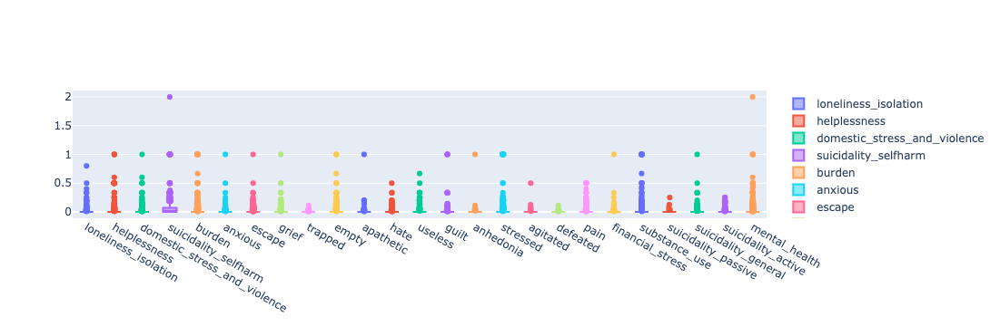

In [483]:
import plotly.graph_objects as go
import numpy as np
np.random.seed(1)
go.Layout(
        yaxis=dict(
            range=[0, 1]
        )
    )



df_features.varA = df_features.SI_DescribeText_clean.str.wrap(60, break_long_words=False)
df_features.varA = df_features.varA.apply(lambda x: x.replace('\n', '<br>'))

text = df_features.varA.to_list()




# text = [split_in_half(i, insert_this='<br>') for i in text]
    


fig = go.Figure()
for col in feature_vectors.columns:
  y =  df_features[col].values

  
  fig.add_trace(go.Box(y=y,
                       name=col,
                       # boxpoints='all',
                      #  text = text_i,
                       hovertext =text,
                       ))
  
fig.update_traces(
    # boxpoints='all', 
    jitter=0.1)


In [469]:
merge

[['loneliness_isolation', 'lonely'],
 ['helplessness', 'hopeless'],
 ['domestic_stress_and_violence', 'fighting'],
 ['suicidality_selfharm', 'cut'],
 ['burden', 'burden']]

In [485]:
# import plotly.express as px
# df = px.data.iris()
# fig = px.parallel_coordinates(df_features, color="mental_health",
#                               dimensions=feature_vectors.columns,
#                               color_continuous_scale=px.colors.diverging.Tealrose,
#                               color_continuous_midpoint=2)
# fig.show()

In [432]:
count_words(['dissapearing'], tokens = final_lexicons.get('cut')
df_features[df_features.SI_DescribeText_clean=='dissapearing']

SyntaxError: invalid syntax (3908267967.py, line 2)

In [ ]:

feature_vectors.boxplot()

In [285]:
feature_vectors

,loneliness_isolation,helplessness,domestic_stress_and_violence,suicidality_selfharm,burden,lonely,anxious,suicidal,hopeless,escape,...,agitated,defeated,pain,cut,financial_stress,substance_use,suicidality_passive,suicidality_general,suicidality_active,mental_health
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2330,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2331,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2332,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2333,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


,loneliness_isolation,helplessness,domestic_stress_and_violence,suicidality_selfharm,burden,lonely,anxious,suicidal,hopeless,escape,...,agitated,defeated,pain,cut,financial_stress,substance_use,suicidality_passive,suicidality_general,suicidality_active,mental_health
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2331,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2332,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [272]:
feature_vectors.div(df.word_count, )

,0,1,2,3,4,5,6,7,8,9,...,pain,stressed,substance_use,suicidal,suicidality_active,suicidality_general,suicidality_passive,suicidality_selfharm,trapped,useless
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2331,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2332,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [173]:
ct_lexicons.get(ct)

array(['accountability', 'affliction', 'albatross', 'anxiety',
       'ball and chain', 'blame', 'bum (out)', 'care', 'cargo', 'charge',
       'chorus', 'clog', 'commitment', 'concern', 'core', 'dash',
       'dead weight', 'deadweight', 'deject', 'depress', 'devoir',
       'difficulty', 'do', 'draft', 'duty', 'effect', 'encumber',
       'encumbrance', 'essence', 'excess baggage', 'fardel', 'freight',
       'get down', 'gist', 'grievance', 'hardship', 'haul', 'headache',
       'herculean task', 'hindrance', 'imperative', 'imposition',
       'incumbency', 'incumbrance', 'lade', 'laden', 'lading', 'load',
       'loading', 'lumber', 'millstone', 'misfortune', 'mishap', 'need',
       'obligation', 'obstruction', 'office', 'onus', 'oppress',
       'payload', 'pill', 'punishment', 'refrain', 'responsibility',
       'sadden', 'saddle', 'sorrow', 'strain', 'task', 'tax',
       "thorn in one's side", 'trial', 'trouble', 'weary load',
       'weigh down', 'weight', 'work', 'worry'], d

In [140]:
!pip install textacy
!python3 -m spacy download en_core_web_sm


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
     |████████████████████████████████| 13.9 MB 1.3 MB/s            
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


# Extract phrases from scale

In [97]:
ucla_loneliness_scale = pd.read_csv('./data/questionnaires/ucla-ls_DD_181001_finalized.csv')
ucla_loneliness_scale.head()

,VARNAME,VARDESC,DOCFILE,TYPE,UNITS,MIN,MAX,RESOLUTION,COMMENT1,COMMENT2,...,Unnamed: 69,Unnamed: 70,Unnamed: 71,Unnamed: 72,Unnamed: 73,Unnamed: 74,Unnamed: 75,Unnamed: 76,Unnamed: 77,Unnamed: 78
0,PX181001_In_Tune_With_People,How often do you feel that you are in tune wit...,DCW_181001.doc,encoded values,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,PX181001_Lack_Companionship,How often do you feel that you lack companions...,DCW_181001.doc,encoded values,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,PX181001_No_One_Can_Turn_To,How often do you feel that there is no one you...,DCW_181001.doc,encoded values,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,PX181001_Feel_Alone,How often do you feel alone?,DCW_181001.doc,encoded values,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,PX181001_Part_Of_Group_Of_Friends,How often do you feel part of a group of friends?,DCW_181001.doc,encoded values,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [86]:
# !pip install keybert

In [92]:
doc = ''.join(ucla_loneliness_scale.VARDESC.values)
doc = doc.replace('How often do you feel', '')
doc

' that you are in tune with the people around you? that you lack companionship? that there is no one you can turn to? alone? part of a group of friends? that you have a lot in common with the people around you? that you are no longer close to anyone? that your interests and ideas are not shared by those around you? outgoing and friendly? close to people? left out? that your relationships with others are not meaningful? that no one really knows you well? isolated from others? you can find companionship when you want it? that there are people who really understand you? shy? that people are around you but not with you? that there are people you can talk to? that there are people you can turn to?'

In [95]:
from keybert import KeyBERT



kw_model = KeyBERT()
keywords = kw_model.extract_keywords(doc, highlight=True, top_n=ucla_loneliness_scale.shape[0], keyphrase_ngram_range=(1, 4), stop_words=None)
print(keywords)

that you are in tune with the people around you? that you lack companionship? that there is 
no one you can turn to? alone? part of a group of friends? that you have a lot in common with
the people around you? that you are no longer close to anyone? that your interests and ideas 
are not shared by those around you? outgoing and friendly? close to people? left out? that 
your relationships with are not meaningful? that no one really knows you well? isolated from 
others? you can find companionship when want it? that there are people who really understand 
you? shy? that people are around you but not with you? that there are people you can talk to?
that there are people you can turn to?

[('that you lack companionship', 0.5933), ('your relationships with others', 0.5887), ('companionship when you', 0.5433), ('lack companionship', 0.537), ('find companionship when you', 0.5298), ('companionship that there is', 0.5211), ('lack companionship that there', 0.5156), ('find companionship when', 0.5023), ('companionship when you want', 0.5015), ('lack companionship that', 0.5001), ('relationships with others', 0.4936), ('relationships with others are', 0.4933), ('you lack companionship', 0.4926), ('isolated from others you', 0.4896), ('companionship when', 0.4844), ('can find companionship when', 0.4821), ('you lack companionship that', 0.4802), ('find companionship', 0.4765), ('can find companionship', 0.4573), ('that your relationships with', 0.4569)]


In [22]:
print(cache_categories)
df2

['lonely', 'anxious', 'suicidal']


,category_label,thesaurus,sense_definition,tokens,annotation_keep
0,lonely,merriam_webster,not being in the company of others,"['alone', 'lone', 'lonesome', 'single', 'solit...",0.0
1,lonely,merriam_webster,sad from lack of companionship or separation f...,"['desolate', 'forlorn', 'lonesome', 'lorn']",0.0
2,lonely,merriam_webster,causing or marked by an atmosphere lacking in ...,"['black', 'bleak', 'cheerless', 'chill', 'cimm...",0.0
3,lonely,synonym_com,nan,['dejected'],0.0
4,lonely,thesaurus_com,nan,"['abandoned', 'alone', 'apart', 'by oneself', ...",0.0
5,lonely,wordnet,nan,None,0.0
6,anxious,merriam_webster,feeling or showing uncomfortable feelings of u...,"['aflutter', 'antsy', 'atwitter', 'dithery', '...",0.0
7,anxious,merriam_webster,marked by or causing agitation or uncomfortabl...,"['agitating', 'creepy', 'disquieting', 'distre...",0.0
8,anxious,merriam_webster,showing urgent desire or interest,"['agog', 'antsy', 'ardent', 'athirst', 'avid',...",0.0
9,anxious,synonym_com,nan,['dying'],0.0


# Compare to LIWC

In [5]:
liwc_features = pd.read_csv('https://raw.githubusercontent.com/danielmlow/liwc/main/liwc2015_features.csv')['0'].values
liwc_features

array(['WC', 'Analytic', 'Clout', 'Authentic', 'Tone', 'WPS', 'Sixltr',
       'Dic', 'function', 'pronoun', 'ppron', 'i', 'we', 'you', 'shehe',
       'they', 'ipron', 'article', 'prep', 'auxverb', 'adverb', 'conj',
       'negate', 'verb', 'adj', 'compare', 'interrog', 'number', 'quant',
       'affect', 'posemo', 'negemo', 'anx', 'anger', 'sad', 'social',
       'family', 'friend', 'female', 'male', 'cogproc', 'insight',
       'cause', 'discrep', 'tentat', 'certain', 'differ', 'percept',
       'see', 'hear', 'feel', 'bio', 'body', 'health', 'sexual', 'ingest',
       'drives', 'affiliation', 'achieve', 'power', 'reward', 'risk',
       'focuspast', 'focuspresent', 'focusfuture', 'relativ', 'motion',
       'space', 'time', 'work', 'leisure', 'home', 'money', 'relig',
       'death', 'informal', 'swear', 'netspeak', 'assent', 'nonflu',
       'filler', 'AllPunc', 'Period', 'Comma', 'Colon', 'SemiC', 'QMark',
       'Exclam', 'Dash', 'Quote', 'Apostro', 'Parenth', 'OtherP'],
      d

In [6]:
liwc_variables = ['Analytic', 'Clout', 'Authentic', 
# 'Tone', 
                  # 'WPS', 'Sixltr',
#        'Dic', 'function', 'pronoun', 'ppron', 'i', 'we', 'you', 'shehe',
#        'they', 'ipron', 'article', 'prep', 'auxverb', 'adverb', 'conj',
       'negate', 
                  # 'verb', 'adj', 'compare', 'interrog', 'number', 'quant',
       'affect', 
                  # 'posemo', 'negemo', 
                  'anx', 'anger', 'sad', 'social',
       'family', 'friend', 'female', 'male', 'cogproc', 'insight',
       'cause', 'discrep', 'tentat', 'certain', 'differ', 'percept',
       'see', 'hear', 'feel', 'bio', 'body', 'health', 'sexual', 'ingest',
       # 'drives', 
                  'affiliation', 'achieve', 'power', 'reward', 'risk',
       # 'focuspast', 'focuspresent', 'focusfuture', 
                  # 'relativ', 
                  'motion',
       'space', 'time', 'work', 'leisure', 'home', 'money', 'relig',
       'death', 'informal', 'swear', 
                  # 'netspeak', 'nonflu',
                  'assent', 
                  ]

In [7]:
run_clean_names = False
if run_clean_names:
    clean = {}
    for i in liwc_variables:
        print(i)
        resp = input()
        if resp == '':
            clean[i] = i
        else:
            clean[i] = resp


In [8]:
liwc_features = {'Analytic': 'Analytic',
 'Clout': 'Clout',
 'Authentic': 'Authentic',
 'negate': 'negate',
 'affect': 'emotion',
 'anx': 'anxious',
 'anger': 'anger',
 'sad': 'sad',
 'social': 'social',
 'family': 'family',
 'friend': 'friend',
 'female': 'female',
 'male': 'male',
 'cogproc': 'think',
 'insight': 'insight',
 'cause': 'cause',
 'discrep': 'disagree',
 'tentat': 'tentative',
 'certain': 'certain',
 'differ': 'differentiation',
 'percept': 'perceive',
 'see': 'see',
 'hear': 'hear',
 'feel': 'feel',
 'bio': 'biological',
 'body': 'body',
 'health': 'health',
 'sexual': 'sexual',
 'ingest': 'ingest',
 'drives': 'drives',
 'affiliation': 'affiliation',
 'achieve': 'achieve',
 'power': 'power',
 'reward': 'reward',
 'risk': 'risk',
 'relativ': 'relativity',
 'motion': 'motion',
 'space': 'space',
 'time': 'time',
 'work': 'work',
 'leisure': 'leisure',
 'home': 'home',
 'money': 'money',
 'relig': 'religion',
 'death': 'death',
 # 'informal': 'informal',
 'swear': 'swear',
 'assent': 'assent'}

In [3]:
# from wordhoard.utilities.basic_soup import Query
# from bs4 import BeautifulSoup
# response = Query(f'https://www.merriam-webster.com/thesaurus/depression').get_single_page_html()
# soup = BeautifulSoup(response.text, "lxml")
# definitions = soup.find_all('span', {'class': 'dt'})
# definitions = [n.text.strip().split('\n')[0].replace('  ','').strip() for n in definitions]




# if soup.find('p', {'class': 'function-label'}):
#     synonyms_all_senses = []
#     parent_tags = soup.find_all("span", {'class': 'thes-list syn-list'})
#     # print(parent_tags)
#     for parent_tag in parent_tags:
#         synonyms_sense_i = []
#         word_container = parent_tag.find('div', {'class': 'thes-list-content synonyms_list'})
#         for list_item in word_container.find_all("ul", {'class': 'mw-list'}):
#             for link in list_item.find_all('a', href=True):
#                 synonym = link.text.lower()
#                 print(synonym)
#                 synonyms_sense_i.append(synonym)
#         # synonyms_sense_i = sorted([cleansing.normalize_space(i) for i in synonyms_sense_i])
#         # synonyms_sense_i = sorted([x.lower() for x in synonyms_sense_i])        
#         # print('88 ', synonyms_sense_i)
#         synonyms_all_senses.append(synonyms_sense_i)
#     split_by_senses = True # TODO REMOVE
#     if split_by_senses:
#         definitions = soup.find_all('span', {'class': 'dt'})
#         definitions = [n.text.strip().split('\n')[0].replace('  ','').strip() for n in definitions]
#         # assert len(definitions) == len(synonyms_list)
#         synonyms = dict(zip(definitions,synonyms_all_senses))





# we're just going to keep merriam webster, because it's easier to tease apart the senses. It's possible with others, especially synonym.com, but I'd need to parse it.
# automatic: choose group closest to psychology or mental health.

In [17]:
# we're just going to keep merriam webster, because it's easier to tease apart the senses. It's possible with others, especially synonym.com, but I'd need to parse it.
# automatic: choose group closest to psychology.
gen_wordhoard('belongingness', search_for = 'synonyms',output_format='dictionary', split_by_senses=True)



{'merriam_webster': {'the state of being in a very personal or private relationship': ['chumminess',
   'closeness',
   'familiarity',
   'inseparability',
   'intimacy',
   'nearness'],
  'transportable items that one owns': ['chattels',
   'duds',
   'effects',
   'gear',
   'goods',
   'holdings',
   'movables',
   'moveables',
   'paraphernalia',
   'personal effects',
   'personal property',
   'personalty',
   'plunder',
   'possession',
   'stuff',
   'things'],
  'to have or be in a usual or proper place': ['going'],
  'to be the property of a person or group of persons': ['appertaining',
   'pertaining']},
 'synonym_com': None,
 'thesaurus_com': None,
 'wordnet': None}

In [13]:
for thesaurus in list(results_separated.keys()):
    tokens = results_separated.get(thesaurus)
    print(thesaurus)
    print(tokens)
    print('\n\n')

NameError: name 'results_separated' is not defined

In [ ]:
# results,results_separated = gen_wordhoard('depression', search_for = 'synonyms', )
# print(results, results_separated)

In [10]:
ct_liwc = {}
chosen_thesauri = []

In [14]:
thesaurus = 'merriam_webster'
tokens = results.get(thesaurus)
tokens = list(tokens.values()) #removes definition
tokens

[['alone', 'lone', 'lonesome', 'single', 'solitary', 'solo', 'unaccompanied'],
 ['desolate', 'forlorn', 'lonesome', 'lorn'],
 ['black',
  'bleak',
  'cheerless',
  'chill',
  'cimmerian',
  'cloudy',
  'cold',
  'comfortless',
  'dark',
  'darkening',
  'depressing',
  'depressive',
  'desolate',
  'dire',
  'disconsolate',
  'dismal',
  'drear',
  'dreary',
  'dreich',
  'elegiac',
  'elegiacal',
  'forlorn',
  'funereal',
  'gloomy',
  'glum',
  'godforsaken',
  'gray',
  'grey',
  'lonesome',
  'lugubrious',
  'miserable',
  'morbid',
  'morose',
  'murky',
  'plutonian',
  'saturnine',
  'sepulchral',
  'solemn',
  'somber',
  'sombre',
  'sullen',
  'sunless',
  'tenebrific',
  'tenebrous',
  'wretched']]

In [18]:
word

'Analytic'

In [22]:
word = 'depression'
results = gen_wordhoard(word, search_for = 'synonyms',output_format='dictionary', split_by_senses=True)



In [26]:
senses = results.get('merriam_webster')
print(senses.keys())
print(senses.values())

dict_keys(['a period of decreased economic activity', 'a state or spell of low spirits', 'a sunken area forming a separate space', 'the amount by which something is lessened'])
dict_values([['recession', 'slump'], ['blue devils', 'blues', 'dejection', 'desolation', 'despond', 'despondence', 'despondency', 'disconsolateness', 'dispiritedness', 'doldrums', 'dolefulness', 'downheartedness', 'dreariness', 'dumps', 'forlornness', 'gloom', 'gloominess', 'glumness', 'heartsickness', 'joylessness', 'melancholy', 'miserableness', 'mopes', 'mournfulness', 'oppression', 'sadness', 'sorrowfulness', 'unhappiness'], ['cavity', 'concavity', 'dent', 'dint', 'hole', 'hollow', 'indentation', 'indenture', 'pit', 'recess'], ['abatement', 'decline', 'decrease', 'decrement', 'dent', 'depletion', 'diminishment', 'diminution', 'drop', 'drop-off', 'fall', 'falloff', 'loss', 'reduction', 'shrinkage', 'step-down']])


In [25]:
results.keys()

dict_keys(['merriam_webster', 'synonym_com', 'thesaurus_com', 'wordnet'])

In [42]:
senses = results.get('merriam_webster')
for sense_definition, sense_tokens in senses.items():
    print(sense_definition)
    print(sense_tokens)
    print('\n')

a hard strike with a part of the body or an instrument
['bang', 'bash', 'bat', 'beat', 'belt', 'biff', 'blow', 'bop', 'box', 'buffet', 'bust', 'chop', 'clap', 'clip', 'crack', 'cuff', 'dab', 'douse', 'fillip', 'hack', 'haymaker', 'hit', 'hook', 'knock', 'larrup', 'lash', 'lick', 'pelt', 'pick', 'plump', 'poke', 'pound', 'punch', 'rap', 'slam', 'slap', 'slug', 'smack', 'smash', 'sock', 'spank', 'stinger', 'stripe', 'stroke', 'swat', 'swipe', 'switch', 'thud', 'thump', 'thwack', 'wallop', 'welt', 'whack', 'wham', 'whop', 'whap']


the power to direct the thinking or behavior of others usually indirectly
['authority', 'credit', 'heft', 'in', 'influence', 'juice', 'leverage', 'pull', 'sway', 'weight']


to deliver a blow to (someone or something) usually in a strong vigorous manner
['bang', 'bash', 'bat', 'belt', 'biff', 'bludgeon', 'bob', 'bonk', 'bop', 'box', 'bust', 'clap', 'clip', 'clobber', 'clock', 'crack', 'hammer', 'hit', 'knock', 'nail', 'paste', 'pound', 'punch', 'rap', 'slam', '

In [82]:
import datetime

In [ ]:
word='lonely'
results1 = gen_wordhoard(word, search_for = 'synonyms',output_format='dictionary', split_by_senses=True)
results2 = gen_wordhoard(word, search_for = 'synonyms',output_format='dictionary', split_by_senses=True)



In [486]:

# df = []
# ct_liwc={}
# columns = ['category_label', 'thesaurus', 'sense_definition', 'tokens']
# for word in list(['lonely', 'anxious']):
#     ct_liwc[word] = []
#     print('\n===', word)
#     results = gen_wordhoard(word, search_for = 'synonyms',output_format='dictionary', split_by_senses=True)
#     # print(results)
#     for thesaurus in list(results.keys()):
#         if thesaurus == 'merriam_webster':
#             senses = results.get(thesaurus)
#             if senses != None:
#                 for sense_definition, sense_tokens in senses.items():
#                     df.append([word, thesaurus, sense_definition, str(sense_tokens)])
#         else:
#             sense_definition = 'nan'
#             tokens = results.get(thesaurus)
#             df.append([word, thesaurus, sense_definition, str(tokens)])

#             # print('\n', thesaurus, tokens)
#             # choose = input('keep?')
#             # # if choose == '1':
#             #         ct_liwc[word].extend(list(tokens))    # keep unique set
#             #         chosen_thesauri.append(thesaurus)
#     # ct_liwc[word] = ct_liwc.get(word)
        
# df = pd.concat([pd.DataFrame(n, index = columns).T for n in df]).reset_index(drop=True)
# df['annotation_keep'] = np.zeros(df.shape[0])
# df
# # ts = datetime.datetime.utcnow().strftime('%y-%m-%dT%H-%M-%S')
# # df.to_csv(f'./data/lexicons/thesauri_tokens_to_annotate_{ts}.csv')
    
    

#     # print(gen_wordhoard(word, search_for = 'Hyponyms'))
#     # print(gen_wordhoard(word, search_for = 'Hypernyms'))


In [17]:
results

{'merriam_webster': {'feeling or showing uncomfortable feelings of uncertainty': ['aflutter',
   'antsy',
   'atwitter',
   'dithery',
   'edgy',
   'goosey',
   'het up',
   'hinky',
   'hung up',
   'ill at ease',
   'insecure',
   'jittery',
   'jumpy',
   'nervous',
   'nervy',
   'perturbed',
   'queasy',
   'queazy',
   'tense',
   'troubled',
   'uneasy',
   'unquiet',
   'upset',
   'uptight',
   'worried'],
  'marked by or causing agitation or uncomfortable feelings': ['agitating',
   'creepy',
   'disquieting',
   'distressful',
   'distressing',
   'disturbing',
   'fraught',
   'hairy',
   'nail-biting',
   'nerve-racking',
   'nerve-wracking',
   'nervous',
   'restless',
   'tense',
   'uneasy',
   'unnerving',
   'unsettling',
   'worrisome'],
  'showing urgent desire or interest': ['agog',
   'antsy',
   'ardent',
   'athirst',
   'avid',
   'crazy',
   'desirous',
   'eager',
   'enthused',
   'enthusiastic',
   'excited',
   'geeked',
   'great',
   'greedy',
   'gung

In [83]:
df = []
columns = ['category_label', 'thesaurus', 'sense_definition', 'tokens']
for word in list(liwc_features.values()):
    ct_liwc[word] = []
    print('\n===', word)
    results = gen_wordhoard(word, search_for = 'synonyms',output_format='dictionary', split_by_senses=True)
    # print(results)
    for thesaurus in list(results.keys()):
        if thesaurus == 'merriam_webster':
            senses = results.get(thesaurus)
            if senses != None:
                for sense_definition, sense_tokens in senses.items():
                    df.append([word, thesaurus, sense_definition, str(sense_tokens)])
                # print('\n', thesaurus, sense_def,sense_tokens)
                # choose = input('keep?')
                # # if choose == '1':
                #     ct_liwc[word].extend(list(sense_tokens))    # keep unique set
                #     chosen_thesauri.append(thesaurus)
        else:
            sense_definition = 'nan'
            tokens = results.get(thesaurus)
            df.append([word, thesaurus, sense_definition, str(tokens)])

            # print('\n', thesaurus, tokens)
            # choose = input('keep?')
            # # if choose == '1':
            #         ct_liwc[word].extend(list(tokens))    # keep unique set
            #         chosen_thesauri.append(thesaurus)
    # ct_liwc[word] = ct_liwc.get(word)
        
df = pd.concat([pd.DataFrame(n, index = columns).T for n in df]).reset_index(drop=True)
df['annotation_keep'] = np.zeros(df.shape[0])
ts = datetime.datetime.utcnow().strftime('%y-%m-%dT%H-%M-%S')
df.to_csv(f'./data/lexicons/thesauri_tokens_to_annotate_{ts}.csv')
    
    

    # print(gen_wordhoard(word, search_for = 'Hyponyms'))
    # print(gen_wordhoard(word, search_for = 'Hypernyms'))



=== sexual

=== ingest

=== drives

=== affiliation

=== achieve

=== power

=== reward

=== risk

=== relativity

=== motion

=== space

=== time

=== work

=== leisure

=== home

=== money

=== religion

=== death

=== swear

=== assent


In [92]:
df = pd.read_csv(f'./data/lexicons/thesauri_tokens_to_annotate_22-05-16T02-39-51.csv', index_col = 0)
df

,category_label,thesaurus,sense_definition,tokens,annotation_keep
0,Analytic,merriam_webster,according to the rules of logic,"['coherent', 'consequent', 'good', 'logical', ...",0.0
1,Analytic,synonym_com,NaN,None,0.0
2,Analytic,thesaurus_com,NaN,"['analytical', 'inquiring', 'investigative', '...",0.0
3,Analytic,wordnet,NaN,None,0.0
4,Clout,merriam_webster,a hard strike with a part of the body or an in...,"['bang', 'bash', 'bat', 'beat', 'belt', 'biff'...",0.0
...,...,...,...,...,...
276,swear,wordnet,NaN,None,0.0
277,assent,merriam_webster,to give or express one's approval (as to a pro...,"['accede', 'acquiesce', 'agree', 'come round',...",0.0
278,assent,synonym_com,NaN,"['acceptance', 'acquiescence', 'agreement', 'c...",0.0
279,assent,thesaurus_com,NaN,"['acceptance', 'accession', 'accord', 'acknowl...",0.0


In [ ]:
liwc_tokens = np.load('./../../util_nlp/liwc_english_dictionary/liwc.npy', allow_pickle=True).tolist()


In [115]:
liwc_tokens.keys()

dict_keys(['total_functional', 'total_pronouns', 'personal_pronouns', '1st_pers', '2nd_pers', '3rd_pers', 'impersonal_pronouns', 'articles_article', 'common_verbs', 'auxiliary_verbs', 'past_tense', 'present_tense', 'future_tense', 'adverbs', 'prepositions', 'conjunctions', 'negations', 'quantifiers', 'numbers', 'swear_words', 'social_processes', 'family', 'friends', 'humans', 'affective_processes', 'positive_emotion', 'negative_emotion', 'anxiety', 'anger', 'sadness', 'cognitive', 'insight', 'causation', 'discrepancy', 'tentative', 'certainty', 'inhibition', 'inclusive', 'exclusive', 'perceptual_processes', 'see', 'hear', 'feel', 'biological', 'body', 'health', 'sexual', 'ingestion', 'relativity', 'motion', 'space', 'time', 'work', 'achievement', 'leisure', 'home', 'money', 'religion', 'death', 'assent', 'nonfluencies', 'fillers'])

In [2]:
a = ['beaut',
 'black',
 'blacke',
 'blackish',
 'blacks',
 'blind',
 'blond',
 'blue',
 'bright',
 'brown',
 'candle',
 'circle',
 'click',
 'color',
 'colour',
 'column',
 'cream',
 'eye',
 'eying',
 'gaz',
 'glanc',
 'glow',
 'gray',
 'green',
 'grey',
 'image',
 'lit',
 'look',
 'looked',
 'looker',
 'looking',
 'looks',
 'orange',
 'picture',
 'pink',
 'purpl',
 'rectang',
 'red',
 'redde',
 'reddish',
 'redness',
 'reds',
 'round',
 'saw',
 'scan',
 'scann',
 'scans',
 'screen',
 'see',
 'seeing',
 'seen',
 'seer',
 'sees',
 'shine',
 'shini',
 'shiny',
 'sight',
 'squar',
 'stare',
 'staring',
 'sunli',
 'sunshin',
 'triang',
 'view',
 'viewer',
 'viewing',
 'views',
 'vivid',
 'watch',
 'white',
 'whitish',
 'yellow']

In [122]:
liwc_tokens.get('see')

['beaut',
 'black',
 'blacke',
 'blackish',
 'blacks',
 'blind',
 'blond',
 'blue',
 'bright',
 'brown',
 'candle',
 'circle',
 'click',
 'color',
 'colour',
 'column',
 'cream',
 'eye',
 'eying',
 'gaz',
 'glanc',
 'glow',
 'gray',
 'green',
 'grey',
 'image',
 'lit',
 'look',
 'looked',
 'looker',
 'looking',
 'looks',
 'orange',
 'picture',
 'pink',
 'purpl',
 'rectang',
 'red',
 'redde',
 'reddish',
 'redness',
 'reds',
 'round',
 'saw',
 'scan',
 'scann',
 'scans',
 'screen',
 'see',
 'seeing',
 'seen',
 'seer',
 'sees',
 'shine',
 'shini',
 'shiny',
 'sight',
 'squar',
 'stare',
 'staring',
 'sunli',
 'sunshin',
 'triang',
 'view',
 'viewer',
 'viewing',
 'views',
 'vivid',
 'watch',
 'white',
 'whitish',
 'yellow']

In [3]:
', '.join(a)

'beaut, black, blacke, blackish, blacks, blind, blond, blue, bright, brown, candle, circle, click, color, colour, column, cream, eye, eying, gaz, glanc, glow, gray, green, grey, image, lit, look, looked, looker, looking, looks, orange, picture, pink, purpl, rectang, red, redde, reddish, redness, reds, round, saw, scan, scann, scans, screen, see, seeing, seen, seer, sees, shine, shini, shiny, sight, squar, stare, staring, sunli, sunshin, triang, view, viewer, viewing, views, vivid, watch, white, whitish, yellow'

# Rules for annotation
1. if they follow psychological sense
2. don't add if most are already available in prior thesauri and has many intrusions (e.g., don't add wordnet for "family")



# Notes on annotation

Left off at female...

- Remove: Authentic, Negate, emotion, differentiation
- Authentic it's not clear what it refers to. So labelled as 0 for now. See paper and perhaps I can use a different word. They may have used non-lexicon approach. 
- Negate is more about negations. 
    - Examples from manual: no, not never
    - any auxiliary verb + not is often contracted, e.g. can't, don't, shan't, shouldn't, won't, but not is rarely contracted with other parts of speech; 
    - negate I searched for could be more for negativity, which might be an interesting category
- Differentiation is not the dictionary sense.
- Hyponyms should be removed from analysis because they are the sum of their hypernyms but they would make for interesting categories (emotion). 
- Good example of annotation of choosing senses is for "anxious" where we leave out "showing urgent desire or interest".


You can let people know how many variables to choose for planned analysis as a function of sample size and minimum effect and type of multiple comparison correction. Also show bayesian approach without multiple comparison correction. 


In [4]:
#!/usr/bin/env python3

'''
Authors: Daniel M. Low
License: Apache 2.0
'''

import numpy as np
import pandas as pd

def subsample_df(df, subsample=3000):
	# subsample rows to balance classes
	if type(subsample) == float:
		# if float (e.g, 0.2) obtain int
		subsample = int(df.shape[0]*subsample)
	df = df.reset_index(drop=True)
	df2 = df.loc[np.random.choice(df.index,subsample, replace=False)]
	return df2


def clean_and_subsample(df, subreddit='addiction', subsample=3000):
	# remove author duplicates and shuffle so we dont keep only first posts in time
	reddit_data = df.sample(frac=1) #shuffle
	reddit_data = reddit_data.drop_duplicates(subset='author', keep='first')
	reddit_data  = reddit_data [~reddit_data.author.str.contains('|'.join(['bot', 'BOT', 'Bot']))] # There is at least one bot per subreddit
	reddit_data = reddit_data[~reddit_data.post.str.contains('|'.join(['quote', 'QUOTE', 'Quote']))] # Remove posts in case quotes are long
	reddit_data = reddit_data.reset_index(drop=True)

	print('before:', subreddit, reddit_data.shape)
	if subsample:
		reddit_data = subsample_df(reddit_data, subsample=subsample)
		print('after:', subreddit, reddit_data.shape)
	return reddit_data


def multiclass(input_dir, subreddits, pre_or_post = 'pre', subsample=None):
	reddit_data = pd.read_csv(input_dir +subreddits[0]+'_{}_features_tfidf_256.csv'.format(pre_or_post), index_col=False)
	reddit_data = clean_and_subsample(reddit_data,subreddits[0], subsample=subsample)

	for i in np.arange(1, len(subreddits)):
		new_data = pd.read_csv(input_dir+subreddits[i]+'_{}_features_tfidf_256.csv'.format(pre_or_post))
		new_data = clean_and_subsample(new_data,subreddits[i], subsample=subsample)
		reddit_data = pd.concat([reddit_data, new_data], axis=0)

	return reddit_data



def binary(input_dir, subreddit, control_subreddits, pre_or_post = 'pre', subsample=None):
	if pre_or_post == 'post':
		# collect mid-pandemic data
		reddit_data = multiclass(input_dir, control_subreddits, pre_or_post=pre_or_post, subsample=subsample)

	if pre_or_post == 'pre':
		# collect pre-pandemic data
		reddit_data = multiclass(input_dir, control_subreddits, pre_or_post=pre_or_post,
		                         subsample=subsample)
		reddit_data_sr = reddit_data[reddit_data.subreddit == subreddit]
		# create control df: remove the treatment and/or overlapping subreddits
		exclude = [subreddit] # Exclude certain the same or overlapping subreddits from control group
		reddit_data_controls = reddit_data[~reddit_data.subreddit.isin(exclude)]
		new_labels = ['control'] * reddit_data_controls.shape[0]
		reddit_data_controls['subreddit'] = new_labels
		print(reddit_data_sr .shape, reddit_data_controls.shape)
		# Subsample to match length of reddit_data
		reddit_data_controls = subsample_df(reddit_data_controls, reddit_data_sr.shape[0])

		# add labels
		reddit_data = pd.concat([reddit_data_sr,reddit_data_controls])

	return reddit_data


In [36]:
import os
input_dir = './../../reddit/input/reddit_mental_health_dataset/'
subreddits = list(np.unique([n.split('_')[0] for n in os.listdir(input_dir)]))
print(len(subreddits))
subreddits.remove('COVID19')
subreddits.remove('Canada')
subreddits.remove('CanadaPolitics')
subreddits.remove('economy')
subreddits.remove('fitness')
subreddits.remove('jokes')
subreddits.remove('meditation')
subreddits.remove('psychosis')
subreddits.remove('politics')
subreddits.remove('relationships')
print(len(subreddits))

37
27


In [34]:
# subreddits = ['addiction','EDAnonymous','adhd','autism','alcoholism', 'bipolarreddit', 'depression', 'anxiety','healthanxiety', 'lonely', 'schizophrenia', 'socialanxiety', 'suicidewatch']

reddit_data = multiclass(input_dir, subreddits, pre_or_post = 'pre', subsample=1300)
reddit_data

before: EDAnonymous (6935, 350)
after: EDAnonymous (1300, 350)
before: ForeverAlone (5543, 350)
after: ForeverAlone (1300, 350)
before: UKPersonalFinance (10513, 350)
after: UKPersonalFinance (1300, 350)
before: addiction (4092, 350)
after: addiction (1300, 350)
before: adhd (16659, 350)
after: adhd (1300, 350)
before: alcoholism (3084, 350)
after: alcoholism (1300, 350)
before: anxiety (19945, 350)
after: anxiety (1300, 350)
before: autism (4563, 350)
after: autism (1300, 350)
before: bipolarreddit (2715, 350)
after: bipolarreddit (1300, 350)
before: bpd (10987, 350)
after: bpd (1300, 350)
before: conspiracy (12421, 350)
after: conspiracy (1300, 350)
before: depression (21161, 350)
after: depression (1300, 350)
before: divorce (6413, 350)
after: divorce (1300, 350)
before: guns (10872, 350)
after: guns (1300, 350)
before: healthanxiety (4246, 350)
after: healthanxiety (1300, 350)
before: legaladvice (23965, 350)
after: legaladvice (1300, 350)
before: lonely (11519, 350)
after: lonely 

,subreddit,author,date,post,automated_readability_index,coleman_liau_index,flesch_kincaid_grade_level,flesch_reading_ease,gulpease_index,gunning_fog_index,...,tfidf_wish,tfidf_without,tfidf_wonder,tfidf_work,tfidf_worri,tfidf_wors,tfidf_would,tfidf_wrong,tfidf_x200b,tfidf_year
5028,EDAnonymous,Horribleawful,2019/06/17,"Recovery limbo Anyone else ""recovered"", but st...",6.780000,7.781930,6.529897,76.031769,64.897436,9.829744,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.182338,0.096633
5640,EDAnonymous,Pyffel,2019/06/03,"Food is the worst ""drug"" Hey guys I'm fat. I'm...",-0.556471,1.470755,1.052059,102.659265,89.000000,3.870588,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000
3040,EDAnonymous,knoxox,2019/05/14,I can't focus on anything but just can't bring...,2.247000,3.587662,3.445000,92.627500,76.000000,5.000000,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.233942
3241,EDAnonymous,HarryHardying,2019/05/26,Will I gain weight if I start eating more norm...,2.215600,3.548463,3.130333,94.883500,76.066667,7.133333,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.133180
4166,EDAnonymous,lizardfan6654,2019/09/18,The pattern I’m about to flip out I had some c...,6.094706,6.208754,7.467451,71.803529,66.254902,9.937255,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
451,unitedkingdom,Orange-of-Cthulhu,2019/08/19,I know how the EU can postpone Brexit for abou...,8.016722,6.512497,8.096160,74.197773,63.011976,10.505689,...,0.0,0.215232,0.0,0.162549,0.0,0.0,0.000000,0.0,0.000000,0.143784
3777,unitedkingdom,Footballboylad,2019/08/09,What to study at university? I've got a place ...,2.583529,5.390655,3.689706,83.748676,82.333333,7.321569,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.240848,0.0,0.000000,0.000000
2294,unitedkingdom,Badgergeddon,2019/02/01,Brexit: How can something we're predicting to ...,6.141238,8.291961,5.813175,76.285000,67.444444,7.365079,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.171791,0.0,0.000000,0.000000
1957,unitedkingdom,chowieuk,2019/03/19,Liam fox announces 'trade agreement' with Norw...,9.645936,13.745543,6.813602,64.278028,63.366197,8.000805,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000


In [38]:
reddit_data.to_csv(input_dir+'../rmhd_27subreddits_1300posts.csv')


In [40]:
reddit_data.columns.tolist()

['subreddit',
 'author',
 'date',
 'post',
 'automated_readability_index',
 'coleman_liau_index',
 'flesch_kincaid_grade_level',
 'flesch_reading_ease',
 'gulpease_index',
 'gunning_fog_index',
 'lix',
 'smog_index',
 'wiener_sachtextformel',
 'n_chars',
 'n_long_words',
 'n_monosyllable_words',
 'n_polysyllable_words',
 'n_sents',
 'n_syllables',
 'n_unique_words',
 'n_words',
 'sent_neg',
 'sent_neu',
 'sent_pos',
 'sent_compound',
 'economic_stress_total',
 'isolation_total',
 'substance_use_total',
 'guns_total',
 'domestic_stress_total',
 'suicidality_total',
 'punctuation',
 'liwc_1st_pers',
 'liwc_2nd_pers',
 'liwc_3rd_pers',
 'liwc_achievement',
 'liwc_adverbs',
 'liwc_affective_processes',
 'liwc_anger',
 'liwc_anxiety',
 'liwc_articles_article',
 'liwc_assent',
 'liwc_auxiliary_verbs',
 'liwc_biological',
 'liwc_body',
 'liwc_causation',
 'liwc_certainty',
 'liwc_cognitive',
 'liwc_common_verbs',
 'liwc_conjunctions',
 'liwc_death',
 'liwc_discrepancy',
 'liwc_exclusive',
 'l

In [50]:
type(df.iloc[1,3])

str

SyntaxError: invalid syntax (1105982060.py, line 1)

In [69]:
# lexicon for each category
df = pd.read_csv(f'./data/lexicons/thesauri_tokens_to_annotate_22-05-16T02-39-51.csv', index_col = 0)

df = df.drop(df[df.tokens=='None'].index)

ct_lexicons = {}
for category in df.category_label.unique():
    df_category = df[df.category_label == category]
    tokens = [eval(n) for n in df_category.tokens.values]
    tokens = np.unique([n for i in tokens for n in i])
    ct_lexicons[category] = tokens
    

In [148]:
ct_lexicons.get('see')

array(['accompany', 'appreciate', 'apprehend', 'ascertain', 'assimilate',
       'attend', 'be apprised of', 'beam', 'behold', 'call (on or upon)',
       'catch', 'catch a glimpse', 'catch a glimpse of', 'catch on (to)',
       'catch sight', 'catch sight of', 'chaperon', 'chaperone', 'clock',
       'cognize', 'companion', 'company', 'compass', 'comprehend',
       'conceit', 'conceive', 'conjure (up)', 'contemplate', 'convoy',
       'cotton (to or on to)', 'decipher', 'decode', 'descry', 'detect',
       'dig', 'discern', 'discover', 'distinguish', 'dream',
       'drop in (on)', 'endure', 'envisage', 'envision', 'escort', 'espy',
       'examine', 'experience', 'eye', 'fancy', 'fantasize', 'fantasy',
       'feature', 'feel', 'find out', 'flash', 'gape', 'gawk', 'gaze',
       'get', 'get a load of', 'get on (to)', 'glare', 'glimpse', 'grasp',
       'grok', 'have', 'hear', 'heed', 'ideate', 'identify', 'image',
       'imagine', 'inspect', 'intuit', 'know', 'lay eyes on', 'learn'

In [87]:
!pip install textacy

  Using cached textacy-0.11.0-py3-none-any.whl (200 kB)
  Using cached jellyfish-0.9.0-cp37-cp37m-macosx_10_14_x86_64.whl (25 kB)
  Using cached pyphen-0.12.0-py3-none-any.whl (2.0 MB)
  Using cached cytoolz-0.11.2-cp37-cp37m-macosx_10_9_x86_64.whl
  Using cached networkx-2.6.3-py3-none-any.whl (1.9 MB)
  Using cached toolz-0.11.2-py3-none-any.whl (55 kB)


In [529]:
!pip install textacy


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [95]:
from textacy import make_spacy_doc, text_stats
def word_count(docs, return_zero = []):
    # python -m spacy download en_core_web_sm
    word_counts = []
    for doc_i in docs:
        doc_i = str(doc_i)
        if doc_i in return_zero:
            word_counts.append(0)
        else:
            doc = make_spacy_doc(doc_i, lang="en_core_web_sm")
            ts = text_stats.TextStats(doc)
            word_counts.append(ts.n_words)
    if len(word_counts)==1:
        return word_counts[0]
    else:
        
        return word_counts

2

In [97]:
0/[2]


TypeError: unsupported operand type(s) for /: 'int' and 'list'

In [98]:
# lemmatize 
# lemmatize documents
# count



import re
def count_words(doc,phrases=[], normalize = True):
    # remove punctuation except apostrophes because we need to search for things like "don't want to live"
    text = re.sub("[^\w\d'\s]+",'',doc.lower())
    counter = 0
    for phrase in phrases:
        counter += text.count(phrase)
    if normalize:
        wc = word_count(docs)
        normalized_count = counter/wc
        return normalized_count
        
    else:
        return counter


# correlate

In [ ]:
c

In [72]:
ct_lexicons.keys()

dict_keys(['Analytic', 'Clout', 'Authentic', 'negate', 'emotion', 'anxious', 'anger', 'sad', 'social', 'family', 'friend', 'female', 'male', 'think', 'insight', 'cause', 'disagree', 'tentative', 'certain', 'differentiation', 'perceive', 'see', 'hear', 'feel', 'biological', 'body', 'health', 'sexual', 'ingest', 'drives', 'affiliation', 'achieve', 'power', 'reward', 'risk', 'relativity', 'motion', 'space', 'time', 'work', 'leisure', 'home', 'money', 'religion', 'death', 'swear', 'assent'])

In [73]:
remove_categories = ['Authentic', 'negate', 'emotion', 'differentiation']


In [78]:
reddit_data.post

5028    Recovery limbo Anyone else "recovered", but st...
5640    Food is the worst "drug" Hey guys I'm fat. I'm...
3040    I can't focus on anything but just can't bring...
3241    Will I gain weight if I start eating more norm...
4166    The pattern I’m about to flip out I had some c...
                              ...                        
451     I know how the EU can postpone Brexit for abou...
3777    What to study at university? I've got a place ...
2294    Brexit: How can something we're predicting to ...
1957    Liam fox announces 'trade agreement' with Norw...
2394    Are £5 polymer notes with low serial numbers (...
Name: post, Length: 35100, dtype: object

In [103]:
word_counts = word_count(docs, return_zero = [])


KeyboardInterrupt: 

In [117]:
#process all posts
docs = list(reddit_data.post)
docs = [doc.replace('\n', ' ').replace('  ',' ').replace('“', '').replace('”', '') for doc in docs]

feature_names = list(ct_lexicons.keys())
# full_column_names = list(df_subreddit.columns) + feature_names
# subreddit_features = pd.DataFrame(columns=full_column_names)

word_counts = reddit_data.n_words.values
feature_vectors = {}
for category in list(ct_lexicons.keys()):
    lexicon_tokens = ct_lexicons.get(category)
    one_category = [count_words(doc,phrases=lexicon_tokens, normalize=False) for doc in docs]
    one_category = one_category/word_counts #normalize

    feature_vectors[category]=one_category


    # # feature_vector = extract_NLP_features(post, features) #removed feature_names from output
    # if len(feature_vector) != 0:
    #     raw_series = list(df_subreddit.iloc[pi])
    #     subreddit_features = subreddit_features.append(pd.Series(raw_series + feature_vector, index=full_column_names), ignore_index=True)  
feature_vectors

{'Analytic': array([0., 0., 0., ..., 0., 0., 0.]),
 'Clout': array([0.03846154, 0.09411765, 0.14      , ..., 0.13333333, 0.08450704,
        0.06956522]),
 'Authentic': array([0.        , 0.        , 0.        , ..., 0.        , 0.01408451,
        0.03478261]),
 'negate': array([0., 0., 0., ..., 0., 0., 0.]),
 'emotion': array([0.01282051, 0.02352941, 0.        , ..., 0.        , 0.01408451,
        0.00869565]),
 'anxious': array([0., 0., 0., ..., 0., 0., 0.]),
 'anger': array([0.        , 0.        , 0.        , ..., 0.        , 0.01408451,
        0.00869565]),
 'sad': array([0.01282051, 0.        , 0.        , ..., 0.        , 0.        ,
        0.00869565]),
 'social': array([0.        , 0.        , 0.        , ..., 0.02222222, 0.        ,
        0.        ]),
 'family': array([0.02564103, 0.05882353, 0.02      , ..., 0.03333333, 0.02816901,
        0.        ]),
 'friend': array([0.01282051, 0.        , 0.        , ..., 0.01111111, 0.01408451,
        0.02608696]),
 'female': 

In [260]:
df.shape

(2335, 50)

In [125]:
feature_vectors = pd.DataFrame(feature_vectors)
feature_vectors 

,Analytic,Clout,Authentic,negate,emotion,anxious,anger,sad,social,family,...,space,time,work,leisure,home,money,religion,death,swear,assent
0,0.0,0.038462,0.000000,0.000000,0.012821,0.0,0.000000,0.012821,0.000000,0.025641,...,0.000000,0.051282,0.000000,0.012821,0.000000,0.025641,0.000000,0.012821,0.000000,0.000000
1,0.0,0.094118,0.000000,0.000000,0.023529,0.0,0.000000,0.000000,0.000000,0.058824,...,0.000000,0.000000,0.035294,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.0,0.140000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.020000,...,0.020000,0.040000,0.060000,0.000000,0.000000,0.000000,0.000000,0.020000,0.000000,0.000000
3,0.0,0.160000,0.013333,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.013333,0.066667,0.026667,0.040000,0.013333,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.0,0.039216,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.078431,0.019608,0.000000,0.000000,0.000000,0.019608,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35095,0.0,0.059880,0.000000,0.005988,0.011976,0.0,0.005988,0.000000,0.000000,0.000000,...,0.005988,0.053892,0.059880,0.000000,0.005988,0.000000,0.000000,0.011976,0.005988,0.000000
35096,0.0,0.098039,0.000000,0.000000,0.019608,0.0,0.000000,0.000000,0.000000,0.019608,...,0.039216,0.039216,0.078431,0.000000,0.039216,0.000000,0.000000,0.000000,0.000000,0.000000
35097,0.0,0.133333,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.022222,0.033333,...,0.000000,0.033333,0.055556,0.022222,0.011111,0.000000,0.000000,0.044444,0.000000,0.000000
35098,0.0,0.084507,0.014085,0.000000,0.014085,0.0,0.014085,0.000000,0.000000,0.028169,...,0.014085,0.000000,0.042254,0.000000,0.000000,0.000000,0.014085,0.014085,0.000000,0.028169


In [127]:
feature_vectors.columns = [n.lower() for n in feature_vectors.columns.values]
feature_vectors

,analytic,clout,authentic,negate,emotion,anxious,anger,sad,social,family,...,space,time,work,leisure,home,money,religion,death,swear,assent
0,0.0,0.038462,0.000000,0.000000,0.012821,0.0,0.000000,0.012821,0.000000,0.025641,...,0.000000,0.051282,0.000000,0.012821,0.000000,0.025641,0.000000,0.012821,0.000000,0.000000
1,0.0,0.094118,0.000000,0.000000,0.023529,0.0,0.000000,0.000000,0.000000,0.058824,...,0.000000,0.000000,0.035294,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.0,0.140000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.020000,...,0.020000,0.040000,0.060000,0.000000,0.000000,0.000000,0.000000,0.020000,0.000000,0.000000
3,0.0,0.160000,0.013333,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.013333,0.066667,0.026667,0.040000,0.013333,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.0,0.039216,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.078431,0.019608,0.000000,0.000000,0.000000,0.019608,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35095,0.0,0.059880,0.000000,0.005988,0.011976,0.0,0.005988,0.000000,0.000000,0.000000,...,0.005988,0.053892,0.059880,0.000000,0.005988,0.000000,0.000000,0.011976,0.005988,0.000000
35096,0.0,0.098039,0.000000,0.000000,0.019608,0.0,0.000000,0.000000,0.000000,0.019608,...,0.039216,0.039216,0.078431,0.000000,0.039216,0.000000,0.000000,0.000000,0.000000,0.000000
35097,0.0,0.133333,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.022222,0.033333,...,0.000000,0.033333,0.055556,0.022222,0.011111,0.000000,0.000000,0.044444,0.000000,0.000000
35098,0.0,0.084507,0.014085,0.000000,0.014085,0.0,0.014085,0.000000,0.000000,0.028169,...,0.014085,0.000000,0.042254,0.000000,0.000000,0.000000,0.014085,0.014085,0.000000,0.028169


In [133]:
liwc_columns = [n for n in reddit_data.columns if 'liwc_' in n]
reddit_data_liwc = reddit_data[liwc_columns]
reddit_data_liwc.columns = [n.split('_')[1] for n in reddit_data_liwc.columns]
reddit_data_liwc
    

,1st,2nd,3rd,achievement,adverbs,affective,anger,anxiety,articles,assent,...,see,sexual,social,space,swear,tentative,time,total,total,work
5028,0,0,0,3,6,5,0,0,6,0,...,0,0,1,2,0,2,12,32,5,0
5640,0,2,0,2,3,8,5,0,3,0,...,0,0,5,1,4,4,3,45,17,0
3040,0,1,0,1,2,3,1,0,2,0,...,0,1,2,2,1,1,2,24,7,2
3241,0,0,0,4,5,1,0,0,4,0,...,0,0,3,1,0,3,9,32,6,0
4166,0,1,0,0,3,2,0,0,6,0,...,0,0,3,2,0,2,3,21,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
451,0,1,4,3,9,2,0,0,16,0,...,0,0,11,7,0,4,10,98,14,4
3777,0,0,0,0,0,3,0,0,2,1,...,0,0,0,4,0,0,1,21,5,0
2294,0,0,1,2,3,3,2,0,7,1,...,0,0,2,6,1,0,4,43,4,1
1957,1,0,1,3,2,3,1,0,3,0,...,0,1,3,3,1,2,2,31,8,5


In [138]:
word_counts.shape

(35100,)

In [140]:
word_counts

array([ 78,  85,  50, ...,  90,  71, 115])

In [141]:
# .sub([1, 2], axis='columns')
reddit_data_liwc = reddit_data_liwc.div(word_counts, axis='rows')
reddit_data_liwc

,1st,2nd,3rd,achievement,adverbs,affective,anger,anxiety,articles,assent,...,see,sexual,social,space,swear,tentative,time,total,total,work
5028,0.000000,0.000000,0.000000,0.038462,0.076923,0.064103,0.000000,0.0,0.076923,0.000000,...,0.000000,0.000000,0.012821,0.025641,0.000000,0.025641,0.153846,0.410256,0.064103,0.000000
5640,0.000000,0.023529,0.000000,0.023529,0.035294,0.094118,0.058824,0.0,0.035294,0.000000,...,0.000000,0.000000,0.058824,0.011765,0.047059,0.047059,0.035294,0.529412,0.200000,0.000000
3040,0.000000,0.020000,0.000000,0.020000,0.040000,0.060000,0.020000,0.0,0.040000,0.000000,...,0.000000,0.020000,0.040000,0.040000,0.020000,0.020000,0.040000,0.480000,0.140000,0.040000
3241,0.000000,0.000000,0.000000,0.053333,0.066667,0.013333,0.000000,0.0,0.053333,0.000000,...,0.000000,0.000000,0.040000,0.013333,0.000000,0.040000,0.120000,0.426667,0.080000,0.000000
4166,0.000000,0.019608,0.000000,0.000000,0.058824,0.039216,0.000000,0.0,0.117647,0.000000,...,0.000000,0.000000,0.058824,0.039216,0.000000,0.039216,0.058824,0.411765,0.058824,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
451,0.000000,0.005988,0.023952,0.017964,0.053892,0.011976,0.000000,0.0,0.095808,0.000000,...,0.000000,0.000000,0.065868,0.041916,0.000000,0.023952,0.059880,0.586826,0.083832,0.023952
3777,0.000000,0.000000,0.000000,0.000000,0.000000,0.058824,0.000000,0.0,0.039216,0.019608,...,0.000000,0.000000,0.000000,0.078431,0.000000,0.000000,0.019608,0.411765,0.098039,0.000000
2294,0.000000,0.000000,0.011111,0.022222,0.033333,0.033333,0.022222,0.0,0.077778,0.011111,...,0.000000,0.000000,0.022222,0.066667,0.011111,0.000000,0.044444,0.477778,0.044444,0.011111
1957,0.014085,0.000000,0.014085,0.042254,0.028169,0.042254,0.014085,0.0,0.042254,0.000000,...,0.000000,0.014085,0.042254,0.042254,0.014085,0.028169,0.028169,0.436620,0.112676,0.070423


In [144]:
from scipy.stats import spearmanr
results = {}
for category in list(ct_lexicons.keys()):
    category = category.lower()
    ct = feature_vectors[category].values
    if category in reddit_data_liwc.columns: 
        liwc_values = reddit_data_liwc[category].values
        rho, p = spearmanr(ct, liwc_values)
        results[category] = rho
    else:
        print(category)
    
results
        

analytic
clout
authentic
negate
emotion
anxious
sad
friend
female
male
think
cause
disagree
certain
differentiation
perceive
ingest
drives
affiliation
achieve
power
reward
risk


{'anger': 0.12212963333467881,
 'social': 0.08233257818157125,
 'family': 0.04528227581416404,
 'insight': 0.057080495062630764,
 'tentative': 0.017588111702746472,
 'see': 0.1344932054882154,
 'hear': 0.06128235409953517,
 'feel': 0.10519710693671155,
 'biological': 0.25773883740112224,
 'body': 0.1195736041080322,
 'health': 0.07280029146499846,
 'sexual': 0.1692599874556922,
 'relativity': -0.004242085549057324,
 'motion': 0.16306395113648478,
 'space': 0.14861130100015066,
 'time': 0.36920997365304,
 'work': 0.06596037808347857,
 'leisure': 0.08806468041928238,
 'home': 0.18167463609892912,
 'money': 0.27526406950259263,
 'religion': 0.2267580015581708,
 'death': 0.11754852680937199,
 'swear': 0.04057224801130137,
 'assent': 0.04270031421492739}

In [146]:
liwc_tokens.get('time')

NameError: name 'liwc_tokens' is not defined

# SEANCE

In [181]:
import sys
def resource_path(relative):
	if hasattr(sys, "_MEIPASS"):
		return os.path.join(sys._MEIPASS, relative)
	return os.path.join(relative)

In [182]:
input_dir = 'data/SEANCE/'

In [184]:


GI_list = open(resource_path(input_dir+'data_files/inquirerbasic.txt'), 'r').readlines()
GI_dict={}

for line in GI_list:
    entries = line.split("\t") #splits entries in .csv file at tab

    GI_dict[entries[0]] = set(entries[1:])
    ##print entries[0]

In [191]:
GI_dict.keys()



dict_keys(['Positiv_GI', 'Negativ_GI', 'Pstv_GI', 'Affil_GI', 'Ngtv_GI', 'Hostile_GI', 'Strong_GI', 'Power_GI', 'Weak_GI', 'Submit_GI', 'Active_GI', 'Passive_GI', 'Pleasur_GI', 'Pain_GI', 'Feel_GI', 'Arousal_GI', 'Emot_GI', 'Virtue_GI', 'Vice_GI', 'Ovrst_GI', 'Undrst_GI', 'Academ_GI', 'Doctrin_GI', 'Econ_2_GI', 'Exch_GI', 'Econ_GI', 'Exprsv_GI', 'Legal_GI', 'Milit_GI', 'Polit_2_GI', 'Polit_GI', 'Relig_GI', 'Role_GI', 'Coll_GI', 'Work_GI', 'Ritual_GI', 'Socrel_GI', 'Race_GI', 'Kin_2_GI', 'Male_GI', 'Female_GI', 'Nonadlt_GI', 'Hu_GI', 'Ani_GI', 'Place_GI', 'Social_GI', 'Region_GI', 'Route_GI', 'Aquatic_GI', 'Land_GI', 'Sky_GI', 'Object_GI', 'Tool_GI', 'Food_GI', 'Vehicle_GI', 'Bldgpt_GI', 'Comnobj_GI', 'Natobj_GI', 'Bodypt_GI', 'Comform_GI', 'Com_GI', 'Say_GI', 'Need_GI', 'Goal_GI', 'Try_GI', 'Means_GI', 'Persist_GI', 'Complet_GI', 'Fail_GI', 'Natrpro_GI', 'Begin_GI', 'Vary_GI', 'Increas_GI', 'Decreas_GI', 'Finish_GI', 'Stay_GI', 'Rise_GI', 'Exert_GI', 'Fetch_GI', 'Travel_GI', 'Fall_GI',

In [ ]:
GI_dict.get('')

In [174]:


with open('data/SEANCE/data_files/inquirerbasic.txt', 'r') as f:
    lines = f.readlines()

    
def dict_builder(database_file, number): #builds dictionaries from database files
    dict ={}

    for entries in database_file:  
        if entries[0] is '#': #ignores first line which contains category information
            continue

        entries = entries.split("\t")
        dict[entries[0]]=entries[number]

    return dict

d = dict_builder(database_file, number)
d



NameError: name 'database_file' is not defined

In [189]:
d.keys()

NameError: name 'd' is not defined

# Encode 

In [8]:
# !pip install sentence_transformers==2.2.0

In [9]:
from sentence_transformers import SentenceTransformer, util


def cosine_similarity(embeddings1, embeddings2):
    #Compute cosine-similarits
    cosine_scores = util.cos_sim(embeddings1, embeddings2)
    # print("{} \t\t {} \t\t Score: {:.4f}".format(sentences1[i], sentences2[i], cosine_scores[i][i]))
    return cosine_scores


def vectorize(docs, model_name = 'all-MiniLM-L6-v2'):
    # https://www.sbert.net/docs/usage/semantic_textual_similarity.html
    model = SentenceTransformer(model_name)
    embeddings = model.encode(docs, convert_to_tensor=True)
    return embeddings


1. Encode
2. Compute similarity with category label
3. Optional: Plot interactive boxplot
4. Rank 

In [23]:
for thesaurus in list(results_separated.keys()):
    tokens = results_separated.get(thesaurus)
    print(thesaurus)
    print(tokens)
    print('\n\n')

merriam_webster
['recession', 'slump', ['blue devils', 'blue funk', 'blues', 'dejection', 'funk', 'low spirits', 'megrims', 'melancholia', 'melancholy', 'mental condition', 'mental state', 'psychological condition', 'psychological state', 'slough of despond', 'vapours'], ['abasement', 'abjection', 'abjectness', 'blahs', 'bleakness', 'blue funk', 'bummer', 'cheerlessness', 'dejection', 'desolation', 'desperation', 'despondency', 'disconsolation', 'discouragement', 'dispiritedness', 'distress', 'dole', 'dolefulness', 'dolor', 'downheartedness', 'dreariness', 'dullness', 'dumps', 'ennui', 'gloom', 'gloominess', 'heaviness of heart', 'heavyheartedness', 'hopelessness', 'lowness', 'lugubriosity', 'melancholia', 'melancholy', 'misery', 'mortification', 'qualm', 'sadness', 'sorrow', 'the blues', 'trouble', 'unhappiness', 'vapors', 'woefulness', 'worry'], ['clinical depression', 'depressive disorder', 'economic crisis', 'great depression', 'impression', 'imprint', 'low', 'natural depression', 

In [18]:
similarities_all = []
for thesaurus in list(results_separated.keys()):
    tokens = results_separated.get(thesaurus)
    embeddings = vectorize(tokens, model_name = 'all-MiniLM-L6-v2')
    assert len(results.keys())
    category_label = results.keys()[0]
    category_label_index = tokens.index(category_label)
    category_label_embedding = embeddings[category_label_index]
    similarities = {}
    for i, token in enumerate(tokens):
        token_embedding = embeddings[tokens.index(token)]
        similarities[token] = cosine_similarity(category_label_embedding, token_embedding)
        similarities = pd.DataFrame(dict(sorted(similarities.items(), key=lambda item: item[1])))
        
similarities_all = pd.concat(similarities_all,axis=0)
similarities_all
        
    

TypeError: 'dict_keys' object is not subscriptable

In [21]:
for word in list(liwc_features.values()):
    print('\n===', word)
    print(gen_wordhoard(word, search_for = 'Synonyms'))
    print(gen_wordhoard(word, search_for = 'Hyponyms'))
    print(gen_wordhoard(word, search_for = 'Hypernyms'))



=== Analytic
['analytical' 'coherent' 'consequent' 'good' 'inquiring' 'investigative'
 'logical' 'problem-solving' 'rational' 'reasonable' 'sensible' 'sound'
 'systematic' 'valid' 'well-founded' 'well-grounded']
No hyponyms were found for the word: Analytic
No hypernyms were found for the word: Analytic

=== Clout
['authority' 'bang' 'bash' 'bat' 'beat' 'belt' 'biff' 'blow' 'bop' 'box'
 'buffet' 'bust' 'chop' 'clap' 'clip' 'clout nail' 'crack' 'cuff' 'dab'
 'douse' 'fillip' 'hack' 'haymaker' 'hit' 'hook' 'influence' 'knock'
 'larrup' 'lash' 'lick' 'pelt' 'pick' 'plump' 'poke' 'pound' 'prestige'
 'pull' 'punch' 'rap' 'slam' 'slap' 'slug' 'smack' 'smash' 'sock' 'spank'
 'standing' 'stinger' 'stripe' 'stroke' 'swat' 'sway' 'swipe' 'switch'
 'thud' 'thump' 'thwack' 'wallop' 'weight' 'welt' 'whack' 'wham' 'whap'
 'whop']
['clout chaser' 'clout demon' 'counter' 'counterpunch' 'haymaker' 'hook'
 'jab' 'knockout punch' 'ko punch' 'parry' 'rabbit punch' 'sucker punch'
 'sunday punch']
['advant


## Goal: stop using LIWC. Show it correlates but is also better.

# Steps
* Find words: using thesaurus, hyponyms, and hypernums because most similar will give antonyms as well. Then you can add top most similar but very high similarity. Add inflections automatically (religion, religious): https://pypi.org/project/pyinflect/
* Perhaps remove compound words already containing seed word (biological sex), keep other word (sex)
* optional: add words or phrases
* remove words automatically, eg > .9 percentile of the average similarity between all words and the construct word. An universal arbitrary cutoff wouldnt work because more general constructs (death) would need to include words less similar than more specific constructs (family). 
* optional: remove words. 
* compute metrics. 
* you can also weigh the words by semantic distance to construct
* remove low frequency words for faster processing
* include lemmatized or stemmed version as well as full version in final count?
* think undirected networks, and metrics they use there.  
* test

In [6]:
from itertools import chain
from nltk.corpus import wordnet
import requests


def gen_wordhoard(word, search_for = 'Definitions'):
    result = eval(search_for.capitalize())(word)
    result = eval(f'result.find_{search_for.lower()}()')
    return np.array(result)


def gen_synonyms(word):
    word = word.lower()
    synonyms = wordnet.synsets(word)
    lemmas = list(set(chain.from_iterable([word.lemma_names() for word in synonyms])))
    return lemmas

def gen_empath_lexicon(seeds,model = 'reddit', size=100,return_lower=True, backend_url="http://54.148.189.209:8000"):
    # seeds: can be list of strings or single word string     
    # model: {fiction, nytimes, reddit, all}. they have different strengths and weaknesses in terms of generating categories. Nytimes would be better for something like the cold war
    if type(seeds) == str:
        seeds = [seeds]
    
    if model == 'all':
        models_to_use = ['reddit', 'nytimes', 'fiction']
        lexicon = []
        for model in models_to_use:
            resp = requests.post(backend_url + "/create_category", json={"terms":seeds,"size":size,"model":model})
            lexicon_model = resp.json()
            lexicon.extend(lexicon_model)
    else:
        resp = requests.post(backend_url + "/create_category", json={"terms":seeds,"size":size,"model":model})
        lexicon = resp.json()
    if return_lower:
        lexicon = [n.lower() for n in lexicon]

    lexicon = [n.replace('_', ' ') for n in lexicon] #'suicidal_ideation'> 'suicidal ideation'
    lexicon = list(set(lexicon)) #unique words
    lexicon.sort()
    return lexicon

# using empath:
# def gen_empath(word):
#     from empath import Empath
#      # make sure this should not be within the function or if it makes a difference.
#     lexicon = Empath()
#     word = word.lower()
#     empath_words = lexicon.create_category("none",[word],model="reddit",size=100,write=False)
#     return empath_words

def gen_related_concepts(token, language = 'en'):
    # https://conceptnet.io/
    # ConceptNet: https://github.com/commonsense/conceptnet5/wiki/API
    token = token.replace('-','_') #as entity recognition
    token = token.replace(' ','_')
    obj = requests.get(f'http://api.conceptnet.io/c/en/{token}').json()
    #     todo: not obtaining all concepts
    concepts = list(set([n.get('end').get('label') for n in obj['edges'] if n.get('end').get('language') == language]))
    return concepts

def gen_seed_tokens(tokens,methods = ['all'], language='en', empath_model='reddit', empath_size=100, empath_return_lower=True):
    # todo: remove duplicates if they appear      
    final_tokens = []
    empath_words =[]
    synonyms=[]
    concepts=[]
    if 'all' in methods:
        methods = ['wordnet', 'conceptnet', 'empath'] #

    
    for token in tokens:        
        if len(token.split())>1:
            # methods that work with phrases
            if 'conceptnet' in methods:
                # 'drive into', 'commit_suicide', 
                # todo: 'Michael_Jordan' should return results, I'm not parsing correctly.
                concepts = gen_related_concepts(token,language=language) #for phrase
            else: 
                print("error: include 'conceptnet' in methods argument when including phrases") #todo add 'all'
        else:
            # methods that work with single words
            if 'empath' in methods:
                empath_words = gen_empath_lexicon(token,
                                                  model=empath_model, size=empath_size, 
                                                  return_lower=empath_return_lower)
            if 'synonyms' in methods:
                synonyms = gen_synonyms(token)
            if 'conceptnet' in methods:
                concepts = gen_related_concepts(token,language=language) #for single word
        for i in [empath_words,synonyms, concepts]:
            if i != None and len(i)>0:
                # this can happen if method not selected or if method returns empty list                 
                final_tokens.extend(i)
    # final_tokens = [item for sublist in final_tokens for item in sublist]
    final_tokens = [n.lower() for n in final_tokens] #todo: just do once in submethods
    tokens = [n.replace('_', ' ') for n in tokens] #wont appear with _ in text
    final_tokens.extend(tokens) #you want to include tokens you provided
    final_tokens = list(set(final_tokens)) #unique words 
    final_tokens.sort()
    return np.array(final_tokens)

# todo: make it possible to re-search words, but it explodes quickly
# def gen_seed_tokens_recursive(tokens, language = 'en', depth=1):
#     # depth>1 creates too many anomalous seeds. Self-harm>body>torso
#     final_tokens = []
#     final_tokens.extend(tokens)
#     for i in range(depth):
#         final_tokens = list(set(final_tokens))
#         tokens_single_pass = gen_seed_tokens_single_pass(final_tokens, language = language)
#         final_tokens.extend(tokens_single_pass)
#     final_tokens = list(set(final_tokens)) #unique words
#     final_tokens.sort()
#     return final_tokens
# make sure all depth=1 words are in depth=2
# all(elem in depth_n  for elem in combined)



In [9]:
gen_seed_tokens(['suicidal'],methods = ['empath'], language='en', empath_model='reddit', empath_size=100, empath_return_lower=True)

array(['actual depression', 'agoraphobia', 'agoraphobic',
       'anti depressants', 'anti-depressants', 'anxiety',
       'anxiety attacks', 'anxiety disorder', 'anxiety issues',
       'anxiety problems', 'anxious', 'bad depression', 'bi-polar',
       'bipolar', 'bipolar person', 'bpd', 'bpd.', 'chronic depression',
       'clinical depression', 'clinically', 'constant anxiety',
       'crippling anxiety', 'crippling depression', 'debilitating',
       'deep depression', 'depressed', 'depressed people',
       'depressed person', 'depressed state', 'depression',
       'depression medication', 'depression/anxiety', 'depressive',
       'depressive episode', 'depressive episodes', 'depressive state',
       'emotional wreck', 'extreme anxiety', 'extreme depression',
       'helpless', 'homicidal', 'hopeless', 'hypomanic', 'ideations',
       'intrusive thoughts', 'major depression',
       'major depressive episode', 'manic', 'manic episode',
       'manic state', 'medicated', 'menta

In [150]:
gen_related_concepts('see', language = 'en')

['see', 'look']

In [120]:
liwc = pd.read_csv('https://github.com/danielmlow/liwc/raw/main/liwc2015_features.csv', index_col = 0)['0'].values
liwc

array(['WC', 'Analytic', 'Clout', 'Authentic', 'Tone', 'WPS', 'Sixltr',
       'Dic', 'function', 'pronoun', 'ppron', 'i', 'we', 'you', 'shehe',
       'they', 'ipron', 'article', 'prep', 'auxverb', 'adverb', 'conj',
       'negate', 'verb', 'adj', 'compare', 'interrog', 'number', 'quant',
       'affect', 'posemo', 'negemo', 'anx', 'anger', 'sad', 'social',
       'family', 'friend', 'female', 'male', 'cogproc', 'insight',
       'cause', 'discrep', 'tentat', 'certain', 'differ', 'percept',
       'see', 'hear', 'feel', 'bio', 'body', 'health', 'sexual', 'ingest',
       'drives', 'affiliation', 'achieve', 'power', 'reward', 'risk',
       'focuspast', 'focuspresent', 'focusfuture', 'relativ', 'motion',
       'space', 'time', 'work', 'leisure', 'home', 'money', 'relig',
       'death', 'informal', 'swear', 'netspeak', 'assent', 'nonflu',
       'filler', 'AllPunc', 'Period', 'Comma', 'Colon', 'SemiC', 'QMark',
       'Exclam', 'Dash', 'Quote', 'Apostro', 'Parenth', 'OtherP'],
      d

In [121]:
liwc_content = ['Clout', 'Authentic', 
       'negate', 'verb', 'adj', 'compare', 'interrog', 'number', 'quant',
       'affect', 'posemo', 'negemo', 'anx', 'anger', 'sad', 'social',
       'family', 'friend', 'female', 'male', 'cogproc', 'insight',
       'cause', 'discrep', 'tentat', 'certain', 'differ', 'percept',
       'see', 'hear', 'feel', 'bio', 'body', 'health', 'sexual', 'ingest',
       'drives', 'affiliation', 'achieve', 'power', 'reward', 'risk',
       'focuspast', 'focuspresent', 'focusfuture', 'relativ', 'motion',
       'space', 'time', 'work', 'leisure', 'home', 'money', 'relig',
       'death', 'informal', 'swear', 'netspeak', 'assent']

In [132]:
# !pip install wordfreq

In [188]:
# # !pip install spacy
# import sys
# !{sys.executable} -m spacy download en_core_web_md

In [189]:
# import spacy
# import numpy as np


# def most_similar(word, topn=5, thresh = -100):
#     nlp = spacy.load('en_core_web_md')
#     word = nlp.vocab[str(word)]
#     print(word.vocab[0].prob)
#     queries = [
#         w for w in word.vocab 
#         if w.is_lower == word.is_lower and w.prob >= thresh and np.count_nonzero(w.vector)
#     ]

#     by_similarity = sorted(queries, key=lambda w: cosine_similarity_numba(w.vector, word.vector), reverse=True)

#     # by_similarity = sorted(queries, key=lambda w: word.cosine_similarity_numba(w), reverse=True)

#     return [(w.lower_,w.similarity(word)) for w in by_similarity[:topn+1] if w.lower_ != word.lower_]

# most_similar("dog", topn=3, thresh = -1000)

In [190]:
# !pip install numba

In [191]:
# from numba import jit

# @jit(nopython=True)
# def cosine_similarity_numba(u:np.ndarray, v:np.ndarray):
#     assert(u.shape[0] == v.shape[0])
#     uv = 0
#     uu = 0
#     vv = 0
#     for i in range(u.shape[0]):
#         uv += u[i]*v[i]
#         uu += u[i]*u[i]
#         vv += v[i]*v[i]
#     cos_theta = 1
#     if uu != 0 and vv != 0:
#         cos_theta = uv/np.sqrt(uu*vv)
#     return cos_theta

In [192]:
# import spacy

# nlp = spacy.load('en_core_web_md')
# tokens = nlp(u'dog')

# for token1 in tokens:
#     for token2 in tokens:
#         print(token1.text, token2.text, token1.similarity(token2))

# print(word.vocab[0].prob)
# queries = [
#     w for w in word.vocab 
#     if w.is_lower == word.is_lower and w.prob >= thresh and np.count_nonzero(w.vector)
# ]
# by_similarity = sorted(queries, key=lambda w: cosine_similarity_numba(w.vector, word.vector), reverse=True)


In [193]:
from wordfreq import word_frequency, zipf_frequency


lang = 'en'
word = 'lonely'

word_freq_df = []
result = gen_wordhoard(word, search_for = 'synonyms')
for result_i in result:
    word_freq_df.append([result_i, word_frequency(result_i, lang, wordlist='best', minimum=0.0), zipf_frequency(result_i, lang, wordlist='best', minimum=0.0)])

word_freq_df = pd.DataFrame(word_freq_df)
word_freq_df.columns = ['word', 'freq', 'zipf']
word_freq_df.sort_values('freq')[::-1]

,word,freq,zipf
11,down,7.590000e-04,5.88
18,left,4.170000e-04,5.62
26,single,2.570000e-04,5.41
1,alone,1.450000e-04,5.16
2,apart,6.030000e-05,4.78
28,solo,4.070000e-05,4.61
12,empty,3.890000e-05,4.59
0,abandoned,2.510000e-05,4.40
23,rejected,2.340000e-05,4.37
16,homeless,1.820000e-05,4.26


In [130]:
for i in liwc_content:
    result = gen_wordhoard(i, search_for = 'antonyms')
    print(i, result)

Clout ['be immune' 'be still' 'destroy' 'discourage' 'dissuade' 'fail' 'give up'
 'halt' 'lose' 'miss' 'neglect' 'not touch' 'pass up' 'pat' 'praise'
 'ruin' 'stop' 'surrender' 'tap' 'unbox' 'uphold']
Authentic ['artificial' 'bogus' 'conjectural' 'counterfeit' 'doubtful' 'dubious'
 'ersatz' 'factitious' 'fake' 'faked' 'false' 'falsified' 'feigned'
 'fraudulent' 'hypothetical' 'ideal' 'illegitimate' 'imitation'
 'imitative' 'inauthentic' 'inexistent' 'ingenuine' 'insincere' 'invalid'
 'knock-off' 'mock' 'nonexistent' 'phoney' 'phony' 'pirated' 'platonic'
 'possible' 'potential' 'pretentious' 'pseudo' 'questionable' 'sham'
 'spurious' 'supposed' 'suppositional' 'suppositious' 'supposititious'
 'synthetic' 'theoretic' 'theoretical' 'unauthentic' 'unauthorised'
 'unauthorized' 'ungenuine' 'unlawful' 'unreal' 'untrue' 'untrustworthy']
negate ['abet' 'abide by' 'accede' 'accede to' 'accept' 'accept as true'
 'accredit' 'acknowledge' 'acquiesce' 'administer' 'admit' 'advance'
 'affirm' 'agree

In [199]:
# https://www.sbert.net/docs/usage/semantic_textual_similarity.html
from sentence_transformers import SentenceTransformer, util
model = SentenceTransformer('all-MiniLM-L6-v2')

# Two lists of sentences
sentences1 = [word]

sentences2 = list(gen_wordhoard(word, search_for = 'synonyms'))

#Compute embedding for both lists
embeddings1 = model.encode(sentences1, convert_to_tensor=True)
embeddings2 = model.encode(sentences2, convert_to_tensor=True)

#Compute cosine-similarits
cosine_scores = util.cos_sim(embeddings1, embeddings2)

#Output the pairs with their score

    print("{} \t\t {} \t\t Score: {:.4f}".format(sentences1[i], sentences2[i], cosine_scores[i][i]))

lonely 		 abandoned 		 Score: 0.3986


In [206]:
np.array(cosine_scores).flatten().shape

(36,)

In [211]:
similarities = pd.DataFrame([sentences2,np.array(cosine_scores).flatten()]).T
similarities.sort_values(1)[::-1]

,0,1
1,alone,0.649992
19,lone,0.61578
20,lonesome,0.57005
26,single,0.568019
28,solo,0.517268
7,deserted,0.51439
27,solitary,0.506098
16,homeless,0.488205
12,empty,0.455521
5,companionless,0.432156


In [71]:


gen_seed_tokens(['coming out'],methods = ['conceptnet'], language='en', empath_model='reddit', empath_size=100, empath_return_lower=True)

array(['come out', 'coming out'], dtype='<U10')

In [2]:
sentences4 = pd.read_csv('./data/sentences_4_liwc.csv', index_col = 0)
sentences4

,Source (B),WC,Analytic,Clout,Authentic,Tone,WPS,Sixltr,Dic,function,...,Comma,Colon,SemiC,QMark,Exclam,Dash,Quote,Apostro,Parenth,OtherP
Source (A),,,,,,,,,,,,,,,,,,,,,
active,I'm going to commit suicide tonight. I bought ...,16,56.25,1.00,99.00,25.77,5.33,18.75,87.50,50.00,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,6.25,0.0,0.0
passive,I wish I would not wake up tomorrow. I'm sick ...,16,5.18,1.00,95.60,1.00,5.33,12.50,100.00,62.50,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,6.25,0.0,0.0
negative,"I'm very tired, I didn't sleep well and I'm cu...",13,1.00,1.00,99.00,99.00,13.00,15.38,92.31,61.54,...,7.69,0.0,0.0,0.0,0.0,0.0,0.0,23.08,0.0,0.0
positive,I'm feeling pretty good. I got a lot of work d...,17,59.32,11.97,66.34,99.00,8.50,17.65,100.00,47.06,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,5.88,0.0,0.0


In [3]:
from empath import Empath
lexicon = Empath()
s4 = sentences4['Source (B)'].values
s4_empath = [lexicon.analyze(n, normalize=True) for n in s4]
s4_empath = pd.DataFrame(s4_empath)
nonzero = s4_empath.sum()[s4_empath.sum()!=0].index
s4_empath[nonzero]

,sleep,medical_emergency,hate,aggression,crime,attractive,prison,health,nervousness,suffering,...,lust,shame,pain,negative_emotion,feminine,weapon,contentment,positive_emotion,none,suicide
0,0.000000,0.0000,0.000000,0.0000,0.0625,0.000000,0.0000,0.0000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000,0.000000,0.0000,0.000000,0.000000,0.0625,0.125
1,0.000000,0.0625,0.062500,0.0625,0.0625,0.000000,0.0625,0.0625,0.000000,0.062500,...,0.000000,0.000000,0.125000,0.125,0.000000,0.0625,0.000000,0.062500,0.0000,0.000
2,0.076923,0.0000,0.000000,0.0000,0.0000,0.000000,0.0000,0.0000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000,0.000000,0.0000,0.000000,0.000000,0.0000,0.000
3,0.000000,0.0000,0.058824,0.0000,0.0000,0.117647,0.0000,0.0000,0.058824,0.058824,...,0.058824,0.058824,0.058824,0.000,0.058824,0.0000,0.058824,0.058824,0.0000,0.000


In [4]:
a = gen_empath_lexicon(['kill_myself'],model = 'reddit', size=100)
[print(n) for n in a]

NameError: name 'gen_empath_lexicon' is not defined

In [101]:
empath_cols = s4_empath.columns.to_list()
empath_cols.sort()


In [81]:
nonzero

Index(['sleep', 'medical_emergency', 'hate', 'aggression', 'crime',
       'attractive', 'prison', 'health', 'nervousness', 'suffering', 'morning',
       'night', 'kill', 'optimism', 'stealing', 'fear', 'business', 'hipster',
       'movement', 'zest', 'death', 'violence', 'sympathy', 'fight', 'war',
       'work', 'appearance', 'youth', 'sadness', 'joy', 'affection', 'lust',
       'shame', 'pain', 'negative_emotion', 'feminine', 'weapon',
       'contentment', 'positive_emotion', 'none'],
      dtype='object')

In [2]:

# import sys
# from importlib import reload
# reload(sys.modules['empath'])

In [3]:
# !pip install openpyxl
# !pip install keybert
# !pip install ipywidgets
# !pip install empath

In [5]:

create_dataset = False
if create_dataset:
    df = pd.read_excel('./../../rallypoint/data/input/sitb_labelled/All-SITBs_9-30-21.xlsx')
    subtypes = df.iloc[:361]
    binary = df.iloc[361:]
    subtypes.drop(['count'], axis=1).to_csv('./../../rallypoint/data/input/sitb_labelled/subtypes_20210930.csv')
    binary.columns
    binary.drop(['count', 'question_response_comments_id', 'created_at', 'Nvivo ID (cleaned)',
       'AJ-EN', 'CW-PF', 'DK-AJ-EN', 'Current ideation', 'Current NSSI',
       'Current Plan', 'Imminent attempt', 'Past Attempt', 'Past ideation',
       'Past NSSI', 'Past plan', '(AUTO) ANY CURRENT', '(AUTO) ANY PAST',
       'Original Agreement', 'Original Agreement.1'],axis=1).to_csv('binary_20210930.csv')


In [6]:
df = pd.read_csv('./../../rallypoint/data/input/sitb_labelled/subtypes_20210930.csv', index_col = 0)
df

,id,uniq_author_identifier,content,question_response_comments_id,created_at,nvivo_id_(cleaned),aj-en,cw-pf,dk-aj-en,current_ideation,...,current_plan,imminent_attempt,past_attempt,past_ideation,past_nssi,past_plan,(auto)_any_current,(auto)_any_past,original_agreement,original_agreement.1
0,5243399,77ede7b9e17a89cc75fe129bc8511598,|body| Sexual assault has been rampant since ...,5243399.0,2019-11-16 22:17:05,5243399.0,1.0,NaN,NaN,0,...,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,FULL AGREEMENT,Agreement
1,1834836,3aff5d463153246d428c647d0f765757,|body| I'm waking up from this war going to s...,1834836.0,2016-08-25 10:53:29,1834836.0,1.0,NaN,NaN,1,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,DISCREPANT,Discrepancy
2,573939,ced3e098eb9ea586b771665fd462d3a6,Why is it ok for them to put animals with feel...,573939.0,2015-04-06 05:09:40,573939.0,1.0,NaN,NaN,1,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,DISCREPANT,Discrepancy
3,4732054,10593b706c24157c73ca2f00587e2d78,I’ve been dealing with heavy depression/suicid...,4732054.0,2019-06-18 15:12:17,4732054.0,1.0,NaN,NaN,1,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,DISCREPANT,Discrepancy
4,332298,83a96174c9d60590e35f52e3ecfbddb4,Is it just me? |body| Is it just me?\n\nEvery ...,332298.0,2014-11-18 16:39:46,332298.0,1.0,NaN,NaN,0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,DISCREPANT,Discrepancy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356,3454301,1dcc0e7ee2e82fd0f02344b63de06f26,I need help brothers how do I deal with PTSD a...,3454301.0,2018-03-17 00:57:52,3454301.0,NaN,NaN,1.0,1,...,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,DISCREPANCY,Discrepancy
357,318252,1847c34c129d6c8cd8ed091f34b3c1bb,I have had both positive and negative experien...,318252.0,2014-11-09 13:04:10,318252.0,NaN,NaN,1.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,FULL AGREEMENT,Agreement
358,5261091,25b1150e664d4adca803caa495982b9c,"I was gang raped in SP Tech School, I went to ...",5261091.0,2019-11-21 20:52:18,5261091.0,NaN,NaN,1.0,1,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,DISCREPANCY,Discrepancy
359,5442583,0e54207ecb0a76b7251c6eff9ede7c34,I rolled a D-7 cat bulldozer down a steep incl...,5442583.0,2020-01-14 14:12:52,5442583.0,NaN,NaN,1.0,1,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,DISCREPANCY,Discrepancy


- **Lexicon symptom tracker**: count words normalized by the amount of words in the doc
- **Semantic symptom tracker**: compute semantic similarity between seed words from lexicons and words in doc.

1. Obtain lexicon seed tokens
- Manually
- Automatic from empath, health questionnaires, Crisis Text Line, DSM-V, Wikipedia, and Reddit.

2.Vectorize seed tokens with sentence embedding (BERT, etc.)

3. Compute


In [7]:
df.iloc[:,9:-4].sum()

current_ideation     87.0
current_nssi          0.0
current_plan         10.0
imminent_attempt      0.0
past_attempt         96.0
past_ideation       212.0
past_nssi             3.0
past_plan            14.0
dtype: float64

In [8]:
# # attempt without ideation
# past_attempt = df[(df['Past Attempt']==1) & (df['Past ideation']!=1)]
# past_attempt.iloc[:,9:-4].sum()


In [9]:
# # ideation without attempt or plan
# past_ideation = df[(df['Past Attempt']!=1) & (df['Past ideation']==1) & (df['Past plan']!=1) & (df['Current Plan']!=1)]
# past_ideation.iloc[:,9:-4].sum()

In [10]:
# import numpy as np
# import pandas as pd
# from sklearn.pipeline import Pipeline
# from sklearn.feature_extraction.text import TfidfVectorizer
# from sklearn.svm import LinearSVC
# from sklearn.metrics import f1_score
# from sklearn.model_selection import train_test_split

# X = past_ideation.content.to_list()+past_attempt.content.to_list()
# y = [0]*len(past_ideation.content.to_list())+[1]*len(past_attempt.content.to_list())

# pipe = Pipeline([
#     ('tfidf', TfidfVectorizer(ngram_range=(1,5))),
#     ('clf', LinearSVC(class_weight='balanced'))
# ])


# # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# # pipe.fit(X_train,y_train) #overfit for features
# # y_pred = pipe.predict(X_test)
# # f1 = f1_score(y_test,y_pred)
# # print(f1)

# pipe.fit(X,y) #overfit for features
# y_pred = pipe.predict(X)
# f1 = f1_score(y,y_pred)
# print(f1)

# # pipe.fit(X,y) #overfit for features

# coefs = pipe.named_steps["clf"].coef_
# # if type(coefs) == csr_matrix:
# #     coefs.toarray().tolist()[0]
# # else:
# coefs.tolist()
# feature_names = pipe.named_steps["tfidf"].get_feature_names()
# coefs_and_features = list(zip(coefs[0], feature_names))
# coefs_and_features
# sorted(coefs_and_features, key=lambda x: abs(x[0]), reverse=True)[:100]

In [11]:
# # see phrases used in Past attemp without many other categories present
# past_attempt = df[(df['Past Attempt']==1)&(df['Past ideation']!=1)]
# print(past_attempt.iloc[:,9:-4].sum())
# past_attempt.content.values[:3]



In [12]:
sitbi = pd.read_csv('./data/questionnaires/ucla-ls_DD_181001_finalized.csv', index_col = 0,encoding='latin1')


items = ' '.join(sitbi.VARDESC.values)
items


'How often do you feel that you are in tune with the people around you? How often do you feel that you lack companionship? How often do you feel that there is no one you can turn to? How often do you feel alone? How often do you feel part of a group of friends? How often do you feel that you have a lot in common with the people around you? How often do you feel that you are no longer close to anyone? How often do you feel that your interests and ideas are not shared by those around you? How often do you feel outgoing and friendly? How often do you feel close to people? How often do you feel left out? How often do you feel that your relationships with others are not meaningful? How often do you feel that no one really knows you well? How often do you feel isolated from others? How often do you feel you can find companionship when you want it? How often do you feel that there are people who really understand you? How often do you feel shy? How often do you feel that people are around you

In [19]:
from keybert import KeyBERT


kw_model = KeyBERT()
keywords = kw_model.extract_keywords(items,top_n=20, keyphrase_ngram_range=(1,1),stop_words=None)

In [20]:
pd.DataFrame(keywords, columns = ['token', 'similarity'])

,token,similarity
0,alone,0.2837
1,often,0.2707
2,companionship,0.2673
3,feel,0.1723
4,friends,0.1582
5,isolated,0.1556
6,around,0.1531
7,relationships,0.1484
8,shy,0.1430
9,friendly,0.1320


In [21]:
keywords = kw_model.extract_keywords(items, keyphrase_ngram_range=(1, 2), stop_words=None, 
                                         highlight=True, 
                                        # use_mmr=True, diversity=0.2
                                    use_maxsum=True, nr_candidates=20, top_n=5)
keywords

How often you feel that you are in tune with the people around you? How often you feel that 
you lack companionship? How often you feel that there is no one you can turn to? How often 
you feel alone? How often you feel part of a group of friends? How often you feel that you 
have a lot in common with the people around you? How often you feel that you are no longer 
close to anyone? How often you feel that your interests and ideas are not shared by those 
around you? How often you feel outgoing and friendly? How often you feel close to people? How
often you feel left out? How often you feel that your relationships with others are not 
meaningful? How often you feel that no one really knows you well? How often you feel isolated
from others? How often you feel you find companionship you want it? How often you feel that 
there are people who really understand you? How often you feel shy? How often you feel that 
people are around but not with you? How often you feel that there are people you can talk to?
How often you feel that there are people you can turn to?

[('feel you', 0.2837),
 ('are around', 0.2316),
 ('feel shy', 0.2245),
 ('how often', 0.0359),
 ('find companionship', -0.1502)]

In [22]:
keywords = kw_model.extract_keywords(items, keyphrase_ngram_range=(1, 3), stop_words=None, 
                                         highlight=True, 
                                        use_mmr=True, diversity=0.2)


How often do you feel that you are in tune with the people around you? How often do you feel 
that you lack companionship? How often do you feel that there is no one you can turn to? How 
often do you feel alone? How often do you feel part of a group of friends? How often do you 
feel that you have a lot in common with the people around you? How often do you feel that you
are no longer close to anyone? How often do you feel that your interests and ideas are not 
shared by those around you? How often do you feel outgoing and friendly? How often do you 
feel close to people? How often do you feel left out? How often do you feel that your 
relationships with others are not meaningful? How often do you feel that no one really knows 
you well? How often do you feel isolated from How often do you feel you can find 
companionship when you want it? How often do you feel that there are people who really 
understand you? How often do you feel shy? How often do you feel that people are around you 
but not with you? How often do you feel that there are people you can talk to? How often do 
you feel that there are people you can turn to?

In [23]:
keywords

[('companionship how often', 0.4647),
 ('feel isolated from', 0.4017),
 ('alone how often', 0.4567),
 ('friends how often', 0.4439),
 ('meaningful how often', 0.3874)]

In [25]:
# https://github.com/MaartenGr/KeyBERT/blob/master/keybert/_model.py
stop_words = None
keyphrase_ngram_range = (1,3)
model ='all-MiniLM-L6-v2' #default, https://www.sbert.net/docs/pretrained_models.html
#SentenceTransformers, Flair, Spacy, Gensim, USE (TF-Hub)
use_maxsum = False
# todo: look into candidates argument
nr_candidates = 20 #The number of candidates to consider if use_maxsum is set to True
seed_keywords = None # averages the key words with the doc. So know the keywords are found from meaning closer to the seeds

# Fit
kw_model = KeyBERT(model=model)
# keywords_1_3 = kw_model.extract_keywords(doc, keyphrase_ngram_range=keyphrase_ngram_range, stop_words=stop_words, 
#                               use_maxsum=use_maxsum, nr_candidates=20, top_n=5)




In [ ]:
# tokens = ['suicide']
# for token in tokens:
#     empath_words = gen_empath(token)
#     synonyms = gen_synonyms(token)
#     concepts = gen_related_concepts(token)
    
# print(empath_words)
# print(synonyms)
# print(concepts)

In [28]:

lexicons = {}
lexicons['death'] = []
concept = 'death'
for model in ['nytimes', 'reddit', 'fiction']:
    lexicon_concept = gen_empath_lexicon([concept],model = model, size=50,return_lower=True, backend_url="http://54.148.189.209:8000")
    lexicons[concept].extend(lexicon_concept)

lexicons[concept] = list(set(lexicons[concept]))
lexicons[concept]

['demise',
 'hell',
 'suffocation',
 'ultimately',
 'misery',
 'sudden death',
 'insanity',
 'abduction',
 'nervous breakdown',
 'tortured',
 'died',
 'natural causes',
 'horrors',
 'suffering',
 'horrible deaths',
 'innocent children',
 'murder',
 'slaying',
 'imprisoned',
 'murdered',
 'impalement',
 'humanity',
 'plague',
 'avenging',
 'recent death',
 'asphyxiation',
 'disappearance',
 'worst',
 'mass death',
 'strangulation',
 'torment',
 'death*.',
 'car crash',
 'bloodshed',
 'vengeance',
 'life',
 'maiming',
 'police custody',
 'assassination',
 'drug overdose',
 'many innocents',
 'car accident',
 'misfortune',
 'own death',
 'dead',
 'dying',
 'accidental death',
 'devastation',
 'auto accident',
 'imminent death',
 'extinction',
 'natural death',
 'tortures',
 'suicide',
 'childbirth',
 'starvation',
 'loved one',
 'victim',
 'stabbing',
 'horrific death',
 'afterlife',
 'more death',
 'grief',
 'more killing',
 'actual death',
 'violent death',
 'many innocent people',
 'in

In [29]:
tokens = ['husband']

methods = ['wordnet', 'conceptnet'] 

In [30]:

gen_seed_tokens(tokens, methods =methods,language='en', 
                           empath_model='all', empath_size=100, empath_return_lower=True)

['husband', 'spouse']

In [31]:
gen_empath_lexicon(tokens, model = 'all')

['10-year-old daughter',
 '11-year-old daughter',
 '2-year-old daughter',
 '2-year-old son',
 '3-year-old daughter',
 '3-year-old son',
 '4-year-old daughter',
 '7-year-old daughter',
 '8-year-old daughter',
 'adoptive mother',
 'adult daughter',
 'ann',
 'anne',
 'aunt',
 'baby brother',
 'baby daughter',
 'beautiful daughter',
 'beloved',
 'beloved wife',
 'best friend',
 'betrothed',
 'bf',
 'bff',
 'bil',
 'biological father',
 'birth mother',
 'boyfriend',
 'bride',
 'brother',
 'brother-in-law',
 'child',
 'children',
 'christine',
 'cindy',
 'colleague',
 'companion',
 'cousin',
 'current husband',
 'current wife',
 'dad',
 'daughter',
 'daughter-in-law',
 'daughters',
 'duchess',
 'duke',
 'elder brother',
 'elder sister',
 'elderly mother',
 'eldest daughter',
 'eldest son',
 'entire family',
 'estranged husband',
 'estranged wife',
 'evelyn',
 'ex',
 'ex husband',
 'ex wife',
 'ex-husband',
 'ex-wife',
 'exhusband',
 'exwife',
 'family',
 'father',
 'father-in-law',
 'fiance'

In [32]:
st_death

NameError: name 'st_death' is not defined

In [33]:
# test: PASSED

seed_tokens = ['suicidal']
for token in seed_tokens:
    print(gen_synonyms(token)) #only works with words
    print(gen_related_concepts(token)) 
    print(gen_empath_lexicon(token))
    print('\ncombined:')
    combined = gen_seed_tokens([token], language='en')
    print(combined)

['self-destructive', 'suicidal']
['be suicidal', 'self-destructive', 'suicidal']
['actual depression', 'agoraphobia', 'agoraphobic', 'anti depressants', 'anti-depressants', 'anxiety', 'anxiety attacks', 'anxiety disorder', 'anxiety issues', 'anxiety problems', 'anxious', 'bad depression', 'bi-polar', 'bipolar', 'bipolar person', 'bpd', 'bpd.', 'chronic depression', 'clinical depression', 'clinically', 'constant anxiety', 'crippling anxiety', 'crippling depression', 'debilitating', 'deep depression', 'depressed', 'depressed people', 'depressed person', 'depressed state', 'depression', 'depression medication', 'depression/anxiety', 'depressive', 'depressive episode', 'depressive episodes', 'depressive state', 'emotional wreck', 'extreme anxiety', 'extreme depression', 'helpless', 'homicidal', 'hopeless', 'hypomanic', 'ideations', 'intrusive thoughts', 'major depression', 'major depressive episode', 'manic', 'manic episode', 'manic state', 'medicated', 'mental breakdown', 'mental health p

In [34]:
seed_tokens = ['rumination']
for token in seed_tokens:
    for model in ['nytimes', 'reddit', 'fiction']:
        a = gen_seed_tokens([token], empath_model = model)
        print('\n\n', model, '=======')
        print(a)



 nytimes =======
['absurdist', 'absurdities', 'allegory', 'anomie', 'artificiality', 'brooding', 'chew', 'concision', 'contemplation', 'crudeness', 'dark humor', 'didacticism', 'distills', 'dreamlike', 'elegiac', 'elegy', 'eros', 'eroticism', 'evanescence', 'evanescent', 'evinces', 'evocation', 'evocations', 'exegesis', 'existential', 'final section', 'grandiosity', 'greek tragedy', 'grimness', 'hallucinatory', 'haunting', 'hilarity', 'hokum', 'human drama', 'idealization', 'incompleteness', 'infuses', 'intimations', 'introspection', 'ironies', 'kaleidoscopic', 'lamentation', 'leitmotif', 'low comedy', 'magical realism', 'many moments', 'meditations', 'melancholia', 'melancholy', 'morality tale', 'mordant', 'musings', 'nihilism', 'ordinariness', 'paean', 'perversity', 'picaresque', 'pretentiousness', 'puritanism', 'rapturous', 'real subject', 'recapitulates', 'recapitulation', 'recollected', 'recurrent', 'reminiscence', 'reportage', 'retelling', 'romanticism', 'ruminate', 'rumination

Compare:
- word based lexicons
- lexicons with and without conjugations and suffix variations
- empath
- semantic symptom tracker 

In [524]:
# lexicons: https://github.com/danielmlow/playbook_comments/blob/main/create_dataset.ipynb

suicidality_active = [
    'commit suicide',
'suicide attempt', #HIGH RISK FOR FALSE POSITIVES
'jump off a bridge',
'throw myself into traffic', #traffic
'drive into something',
'kill myself',
'hang myself', 
'shoot myself', 
'gun in my mouth',
"I'm going to overdose",
"I'm going to take a lot of pills",
'it all ends tonight',
'end my life',
'going to end my life',
"dispose of my body",
'going to die tonight', 
'will die tonight', 
'pull the trigger',]

# 'this is my last day',

suicidality_passive = [
#    passive
"would be better off dead", 

    "don't want to be here anymore",
    "don't want to live anymore"

    "I want to die", 
    "I don't want to live", #"don't want to be alive",

'I want to go to sleep and not wake up',
"I don't want to wake up",

'I wish it would all end', 
"I'm done with living",
"there's no point in living",    

"There's nothing to live for",
'kill me',

'I think about death',
"life isn't worth living",
"I'm ready to go", 
"don't care if I live or die'",
"wish I were never born",
"I have no future",   
'let me die',
]



Check if if captures slang and spelling variations

'never want to wake up','never wanna wake up',
"don't want to wake up","don't wanna wake up",

"want to die", "wanting to die","wanted to die","wanna die",
"don't want to live", 'not wanting to live',

In [41]:
past_ideation.content.values[:5]

NameError: name 'past_ideation' is not defined

In [525]:
import symptom_tracker
from importlib import reload
reload(symptom_tracker)

<module 'symptom_tracker' from '/Users/danielmlow/Dropbox (MIT)/datum/catpro/catpro/symptom_tracker.py'>

In [526]:
df.columns

Index(['id', 'uniq_author_identifier', 'content',
       'question_response_comments_id', 'created_at', 'nvivo_id_(cleaned)',
       'aj-en', 'cw-pf', 'dk-aj-en', 'current_ideation', 'current_nssi',
       'current_plan', 'imminent_attempt', 'past_attempt', 'past_ideation',
       'past_nssi', 'past_plan', '(auto)_any_current', '(auto)_any_past',
       'original_agreement', 'original_agreement.1'],
      dtype='object')

In [549]:
# plan = df[(df['Current Plan']==1 )|(df['Past plan']==1 ) ]['content'].values
# ideation = df[(df['Current ideation']==1 )|(df['Past ideation']==1 ) ]['content'].values
# print(plan.shape, ideation.shape)

In [550]:
from sklearn.feature_extraction.text import CountVectorizer

In [35]:
# https://github.com/MaartenGr/KeyBERT/blob/master/keybert/_model.py
stop_words = None
# keyphrase_ngram_range = (1,5)
keyphrase_ngram_range = 'automatic'


model ='all-MiniLM-L6-v2' #default, https://www.sbert.net/docs/pretrained_models.html
#SentenceTransformers, Flair, Spacy, Gensim, USE (TF-Hub)
# todo: look into candidates argument
# nr_candidates = 20 #The number of candidates to consider if use_maxsum is set to True
seed_keywords = None # averages the key words with the doc. So know the keywords are found from meaning closer to the seeds


vectorizer = CountVectorizer(ngram_range=keyphrase_ngram_range, 
                             stop_words=stop_words, 
                             token_pattern=r"(?u)\b\w\w+\b|!|\?|\"|\'") # https://stackoverflow.com/questions/39254134/how-to-preserve-punctuation-marks-in-scikit-learn-text-countvectorizer-or-tfidfv

NameError: name 'CountVectorizer' is not defined

In [36]:
candidates

NameError: name 'candidates' is not defined

In [37]:


# doc = plan [0]
# scores_active = []
# scores_passive = []
# st_model = symptom_tracker.KeyBERT(model=model)

# docs = ideation[3:8]
# for doc in docs:
#     for suicidality_type, name in zip([suicidality_active,suicidality_passive], ['active', 'passive']): 
#         keywords = st_model.extract_keywords(doc, seed_lexicon = suicidality_type, 
#                                                  # vectorizer = vectorizer,
#                                                  keyphrase_ngram_range=keyphrase_ngram_range, 
#                                                  stop_words=stop_words, top_n=20, highlight=False)
#         if name == 'active':
#             scores_active.append(np.sum([n[1] for n in keywords]))
#         elif name == 'passive':
#             scores_passive.append(np.sum([n[1] for n in keywords]))
        
        
# print(np.mean(scores_active))
# print(np.sum(scores_active))    

# print(np.mean(scores_passive))
# print(np.sum(scores_passive))
        

In [38]:
# st_model = symptom_tracker.KeyBERT(model=model)

In [39]:
st_model = symptom_tracker.KeyBERT(model=model) # slow part

NameError: name 'symptom_tracker' is not defined

In [40]:
docs = [
    "I'm going to commit suicide tonight. I bought the gun. Or I will jump into traffic.",
    "I'm going to end it tonight. I have pills and I'm going to take all of them",
    "I wish I would not wake up tomorrow. I'm sick of this. Please someone kill me.",
    "I can't stand life anymore. I'm too exhausted. I wish it would end.",
    
    "I'm feeling pretty good. I got a lot of work done and am looking forward to dinner.",
    "I'm very tired, I didn't sleep well and I'm currently stuck in traffic.",

]

'''
doc 1: active
doc 2: passive

'''

keyphrase_ngram_range = (3,5)

stats = []
pairwise_all = []
# Predicted order as a function of seed words: 'si_active_hi'/'si_passive_hi',  'si_active_lo'/'si_passive_lo','negative', 'positive', ]
doc_names = ['si_active_hi', 'si_active_lo','si_passive_hi',  'si_passive_lo', 'positive', 'negative']
for doc, doc_name in zip(docs,doc_names):
# doc = docs[1]
    for feature_lexicon, feature_lexicon_name in zip([suicidality_active,suicidality_passive], ['active', 'passive']): 
    # suicidality_type = suicidality_active
        distances, candidates, keywords,final_ngram_range = st_model.extract_keywords(doc, seed_lexicon = feature_lexicon, 
                                                 # vectorizer = vectorizer,
                                                 keyphrase_ngram_range=keyphrase_ngram_range, 
                                                 stop_words=stop_words, top_n=50, highlight=False)
        pairwise = pd.DataFrame(distances, columns = candidates, index = feature_lexicon)
        pairwise_values = pairwise.values
        similarity_sum = np.sum(pairwise_values)/len(pairwise_values)
        similarity_median = np.median(pairwise_values)
        similarity_mean = np.mean(pairwise_values)
        similarity_min = np.min(pairwise_values)
        similarity_max = np.max(pairwise_values)
        # you want the value to be influenced by outliers (the highest values) so use mean         
        similarity_top_15 = np.mean(pairwise.stack().nlargest(15,keep='all').values)
        similarity_top_30 = np.mean(pairwise.stack().nlargest(30,keep='all').values)
        similarity_mean_above_05cos = np.mean(pairwise_values[pairwise_values>0.5])
        similarity_mean_above_median = np.mean(pairwise_values[pairwise_values>similarity_median])
        similarity_mean_above_75 = np.mean(pairwise_values[pairwise_values>np.percentile(pairwise_values,75)])
        
        n = len(pairwise_values.flatten())
        plt.hist(pairwise.stack().nlargest(n,keep='all').values, bins=200)
        plt.title(f'doc: {doc_name}\nfeature:{feature_lexicon_name}\n{similarity_min, similarity_median, similarity_mean_above_median}')
        plt.xlim([0,1])
        plt.ylim([0,40])
                 
        plt.show()

        # similarity_max = np.nlargest(pairwise_values,30)
        # print(similarity_median, similarity_min, similarity_max)
        stats.append([feature_lexicon_name, doc_name, doc, similarity_sum, similarity_mean,similarity_median, similarity_min, similarity_max, similarity_mean_above_05cos, similarity_mean_above_median, similarity_mean_above_75, similarity_top_15, similarity_top_30])
        pairwise_all.append(pairwise)



        
        

NameError: name 'suicidality_active' is not defined

Text(855.1249999999999, 0.5, 'Lexicon')

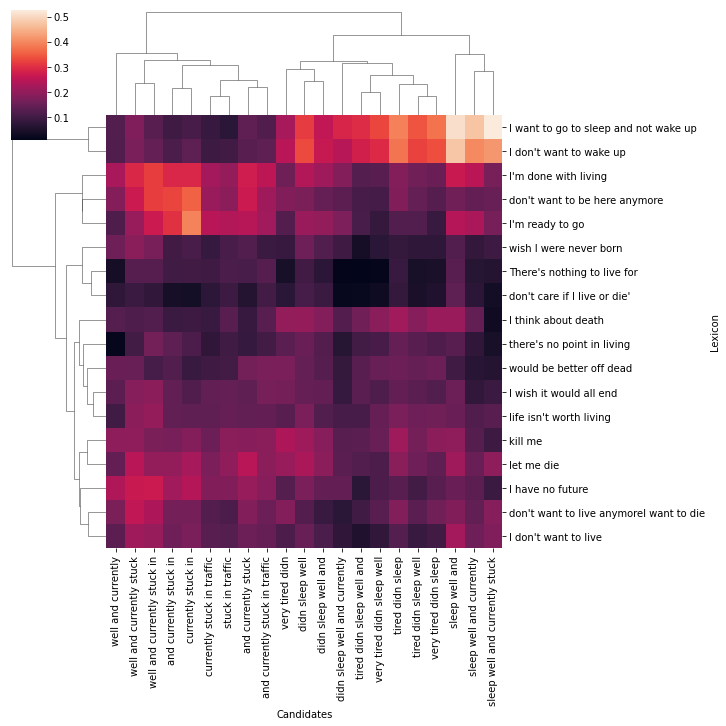

In [561]:
import seaborn as sns
import matplotlib.pyplot as plt
g = sns.clustermap(pairwise)
ax = g.ax_heatmap
ax.set_xlabel("Candidates")
ax.set_ylabel("Lexicon")
# plt.xlabel()
# plt.ylabel('Lexicon')

In [562]:
results = pd.DataFrame(stats, columns=['feature_name', 'doc_name', 'doc', 'similarity_sum','similarity_mean','similarity_median', 'similarity_min', 'similarity_max','similarity_mean_above_05cos', 'similarity_mean_above_median', 'similarity_mean_above_75', 'similarity_top_15', 'similarity_top_30'])
# results = results.sort_values('similarity_median')[::-1]

[print(f"{n[0]}: {n[1]}") for n in zip(doc_names, results.doc.values[::2])]
# results.round(2).sort_values('similarity_median')[::-1]
results.iloc[:,3:] = results.iloc[:,3:].astype(float).round(5)
results = results.fillna(0)
results_rank = results.assign(**results.iloc[:,3:].rank(axis = 0, ascending = False).astype(int))
results_rank

'''
active si_active_hi: 1
active si_active_lo: 2

active si_passive_hi: 3
active si_passive_lo: 3

passive si_passive_hi: 1
passive si_passive_lo: 2

passive si_active_hi: 3
passive si_active_lo: 3

active positive: 6
active negative: 4

passive positive: 5
passive negative: 4
'''

ideal_rank = [1,3,2,3,3,1,3, 2, 6, 5, 4, 4]

               



si_active_hi: I'm going to commit suicide tonight. I bought the gun. Or I will jump into traffic.
si_active_lo: I'm going to end it tonight. I have pills and I'm going to take all of them
si_passive_hi: I wish I would not wake up tomorrow. I'm sick of this. Please someone kill me.
si_passive_lo: I can't stand life anymore. I'm too exhausted. I wish it would end.
positive: I'm feeling pretty good. I got a lot of work done and am looking forward to dinner.
negative: I'm very tired, I didn't sleep well and I'm currently stuck in traffic.


In [565]:
results

,feature_name,doc_name,doc,similarity_sum,similarity_mean,similarity_median,similarity_min,similarity_max,similarity_mean_above_05cos,similarity_mean_above_median,similarity_mean_above_75,similarity_top_15,similarity_top_30
0,active,si_active_hi,I'm going to commit suicide tonight. I bought ...,8.93533,0.29784,0.25953,0.02554,0.85206,0.61007,0.42224,0.51524,0.73337,0.67746
1,passive,si_active_hi,I'm going to commit suicide tonight. I bought ...,5.96150,0.19872,0.17687,-0.01655,0.54235,0.51984,0.28265,0.34959,0.47781,0.44340
2,active,si_active_lo,I'm going to end it tonight. I have pills and ...,9.54835,0.28934,0.25431,0.04424,0.82827,0.62278,0.38090,0.47242,0.73948,0.67648
3,passive,si_active_lo,I'm going to end it tonight. I have pills and ...,6.62947,0.20089,0.18785,0.02702,0.60078,0.56532,0.27181,0.32919,0.54562,0.47274
4,active,si_passive_hi,I wish I would not wake up tomorrow. I'm sick ...,8.13949,0.27132,0.26345,0.05142,0.67866,0.53677,0.35520,0.41672,0.53153,0.50297
5,passive,si_passive_hi,I wish I would not wake up tomorrow. I'm sick ...,8.06789,0.26893,0.25730,0.05772,0.78902,0.60490,0.34507,0.40789,0.65178,0.58236
6,active,si_passive_lo,I can't stand life anymore. I'm too exhausted....,5.15981,0.24571,0.23245,0.03267,0.61821,0.56335,0.32726,0.37660,0.50775,0.45428
7,passive,si_passive_lo,I can't stand life anymore. I'm too exhausted....,5.84484,0.27833,0.25988,0.03458,0.92759,0.57841,0.37108,0.44091,0.59787,0.54422
8,active,positive,I'm feeling pretty good. I got a lot of work d...,5.74299,0.17403,0.17015,-0.00075,0.39187,0.00000,0.22752,0.26238,0.35037,0.32563
9,passive,positive,I'm feeling pretty good. I got a lot of work d...,4.62675,0.14020,0.12973,-0.05029,0.47069,0.00000,0.20268,0.25010,0.40373,0.36035


In [566]:
results_rank['ideal_rank']=ideal_rank

# look at last row, ideal_rank, and choose the ones that give you best
results_rank.iloc[3:].corr('pearson')

,similarity_sum,similarity_mean,similarity_median,similarity_min,similarity_max,similarity_mean_above_05cos,similarity_mean_above_median,similarity_mean_above_75,similarity_top_15,similarity_top_30,ideal_rank
similarity_sum,1.000000,0.731575,0.753791,0.788843,0.493473,0.497841,0.698696,0.698696,0.743905,0.768565,0.558744
similarity_mean,0.731575,1.000000,0.979155,0.890270,0.917401,0.757605,0.994595,0.994595,0.829730,0.866216,0.806619
similarity_median,0.753791,0.979155,1.000000,0.879214,0.895983,0.690997,0.981378,0.981378,0.779101,0.839117,0.762556
similarity_min,0.788843,0.890270,0.879214,1.000000,0.765731,0.668776,0.886765,0.886765,0.795635,0.837695,0.841318
similarity_max,0.493473,0.917401,0.895983,0.765731,1.000000,0.833016,0.927160,0.927160,0.818585,0.851524,0.875895
similarity_mean_above_05cos,0.497841,0.757605,0.690997,0.668776,0.833016,1.000000,0.728634,0.728634,0.835828,0.796717,0.889269
similarity_mean_above_median,0.698696,0.994595,0.981378,0.886765,0.927160,0.728634,1.000000,1.000000,0.800000,0.848649,0.795137
similarity_mean_above_75,0.698696,0.994595,0.981378,0.886765,0.927160,0.728634,1.000000,1.000000,0.800000,0.848649,0.795137
similarity_top_15,0.743905,0.829730,0.779101,0.795635,0.818585,0.835828,0.800000,0.800000,1.000000,0.987838,0.909958
similarity_top_30,0.768565,0.866216,0.839117,0.837695,0.851524,0.796717,0.848649,0.848649,0.987838,1.000000,0.909958


In [567]:
metrics = ['similarity_mean',	'similarity_median', 'similarity_max', 'similarity_mean_above_median', 'similarity_top_30', ]

In [568]:
# build new dataset
df = pd.read_csv('./../../rallypoint/data/input/sitb_labelled/subtypes_20210930.csv', index_col = 0)
past_attempt = df[((df['past_attempt']==1) | (df['imminent_attempt']==1)) &
                (df['past_plan']!=1) &
                (df['current_plan']!=1) &
                (df['current_nssi']!=1) &
                (df['current_ideation']!=1) &
                (df['past_ideation']!=1) &
                (df['past_nssi']!=1)
                 ]

# plan was removed because there were only 2 that weren't also some other form of SITB.
                  
print(active_si.iloc[:,9:-4].sum())



past_ideation = df[(df['past_ideation']==1) &
                (df['current_ideation']!=1) &
                (df['current_nssi']!=1) &
                (df['imminent_attempt']!=1) &
                (df['past_attempt']!=1) &
                (df['past_nssi']!=1) &
                (df['current_plan']!=1) &
                (df['past_plan']!=1) 
                 ]
print(past_ideation.iloc[:,9:-4].sum())


current_ideation = df[(df['current_ideation']==1) &
                (df['past_ideation']!=1) &
                (df['current_nssi']!=1) &
                (df['imminent_attempt']!=1) &
                (df['past_attempt']!=1) &
                (df['past_nssi']!=1) &
                (df['current_plan']!=1) &
                (df['past_plan']!=1) 
                 ]

print(current_ideation.iloc[:,9:-4].sum())

# active = df[(df['current ideation']!=1)]# &
#     # (df['Past ideation']!=1) ]
# active.sum()



current_ideation     0.0
current_nssi         0.0
current_plan         0.0
imminent_attempt     0.0
past_attempt        70.0
past_ideation        0.0
past_nssi            0.0
past_plan            0.0
dtype: float64
current_ideation      0.0
current_nssi          0.0
current_plan          0.0
imminent_attempt      0.0
past_attempt          0.0
past_ideation       168.0
past_nssi             0.0
past_plan             0.0
dtype: float64
current_ideation    52.0
current_nssi         0.0
current_plan         0.0
imminent_attempt     0.0
past_attempt         0.0
past_ideation        0.0
past_nssi            0.0
past_plan            0.0
dtype: float64


In [569]:
past_attempt.to_csv('./../../rallypoint/data/input/sitb_labelled/past_attempt_70_20210930.csv')
past_ideation.to_csv('./../../rallypoint/data/input/sitb_labelled/past_ideation_168_20210930.csv')
current_ideation.to_csv('./../../rallypoint/data/input/sitb_labelled/current_ideation_52_20210930.csv')

In [570]:
past_attempt.columns

Index(['id', 'uniq_author_identifier', 'content',
       'question_response_comments_id', 'created_at', 'nvivo_id_(cleaned)',
       'aj-en', 'cw-pf', 'dk-aj-en', 'current_ideation', 'current_nssi',
       'current_plan', 'imminent_attempt', 'past_attempt', 'past_ideation',
       'past_nssi', 'past_plan', '(auto)_any_current', '(auto)_any_past',
       'original_agreement', 'original_agreement.1'],
      dtype='object')

In [582]:
clean_set = pd.concat([past_attempt.sample(n=50),past_ideation.sample(n=50),current_ideation.sample(n=50)])
clean_set = clean_set[['id', 'uniq_author_identifier', 'content',
       'question_response_comments_id', 'created_at', 'current_ideation', 
       'past_attempt', 'past_ideation','original_agreement', 'original_agreement.1']]

clean_set = clean_set.reset_index(drop=True)
clean_set.to_csv('./../../rallypoint/data/input/sitb_labelled/clean_set_20210930.csv')



In [583]:
clean_set = pd.read_csv('./../../rallypoint/data/input/sitb_labelled/clean_set_20210930.csv', index_col = 0)
clean_set

,id,uniq_author_identifier,content,question_response_comments_id,created_at,current_ideation,past_attempt,past_ideation,original_agreement,original_agreement.1
0,864343,bdec8ff17686753c0d0d2322ed487966,"I tried to commit suicide when I was 14, I was...",864343.0,2015-08-04 14:23:20,0,1.0,0.0,FULL AGREEMENT,Agreement
1,1766063,42638c4f157cebae566828757b57d18b,", I've attempted twice a long time ago, before...",1766063.0,2016-08-01 00:36:22,0,1.0,0.0,FULL AGREEMENT,Agreement
2,466693,ced3e098eb9ea586b771665fd462d3a6,How do we get more veterans to call to use sui...,466693.0,2015-02-10 04:25:04,0,1.0,0.0,FULL AGREEMENT,Agreement
3,4635592,c7cb04b91db76f4a7fc344696704b03e,YOU KNOW WHAT HAPPENS WHEN YOU KNOW THAT DEATH...,4635592.0,2019-05-14 22:08:38,0,1.0,0.0,FULL AGREEMENT,Agreement
4,128273,5031d416438fa9b292101a89f039c51f,I totally agree with you SPC Smith. I served i...,128273.0,2014-05-16 20:43:31,0,1.0,0.0,FULL AGREEMENT,Agreement
...,...,...,...,...,...,...,...,...,...,...
145,4273899,a9633a6a3610dd2e89b7a5f8bee9b581,"Hi, complicated question...I am an E1 in the U...",4273899.0,2019-01-10 05:17:59,1,0.0,0.0,DISCREPANT,Discrepancy
146,4424180,1d7de72f5131c064fe1a79a1b5bb03b1,"I can’t take credit. And, if you see the handw...",4424180.0,2019-03-06 11:10:53,1,0.0,0.0,FULL AGREEMENT,Agreement
147,559896,195a566923c65fe8ea0fc0f8fbec54de,One of the ways i deal with episodes is going ...,559896.0,2015-03-29 17:07:20,1,0.0,0.0,FULL AGREEMENT,Agreement
148,3024306,1051a728643b811fe8c159736886e6b4,"Troops, it seems the older I get the less pait...",3024306.0,2017-10-23 03:00:16,1,0.0,0.0,DISCREPANCY,Discrepancy


In [584]:
doc

"How about answering why the V.A. denies deserving veteran's care who desperately need it in order to NOT be broken/damaged/etc... ? How about answering why veteran's like myself have been treated like ass, or even worse simply because of political BULLSHIT?\n\nAnswer those questions, concisely and not in politospeak, or in any manner which reverts to political BS, profit and greed, promotion, and positive press.\n\nEDIT : And to be concise, here. My position on this is partly personal. I have been denied mental health claims since 2002 which I should NOT have been denied, only because the v.a. claims that there are no records which indicate I deserve mental health care. I have been given mental health treatment only sporadically and with no care to my needs based on people not believing what I say and calling me a lying prick and worse.\nBecause I have been denied mental health help, I attempted suicide MANY times and even got sent to prison due to being treated like shit.\n\nI am com

In [585]:
from scipy.stats import mode 

mode([len(n.split()) for n in suicidality_passive]).mode[0]

4

In [586]:
clean_set.id.unique().shape

(150,)

In [587]:
%%time
# Run for the clean_set


keyphrase_ngram_range = (4,5)

stats = []
pairwise_all = {}

cols = ['current_ideation', 'past_ideation', 'past_attempt']
for i, (doc,doc_id) in enumerate(zip(clean_set.content.values,clean_set.id.values)):
    print(i)
    stats_doc = []
# Predicted order as a function of seed words: 'si_active_hi'/'si_passive_hi',  'si_active_lo'/'si_passive_lo','negative', 'positive', ]
    for feature_lexicon, feature_lexicon_name in zip([suicidality_active,suicidality_passive], ['active', 'passive']): 
    # suicidality_type = suicidality_active
        distances, candidates, keywords,final_ngram_range = st_model.extract_keywords(doc, seed_lexicon = feature_lexicon, 
                                                 # vectorizer = vectorizer,
                                                 keyphrase_ngram_range=keyphrase_ngram_range, 
                                                 stop_words=stop_words, top_n=50, highlight=False)
        pairwise = pd.DataFrame(distances, columns = candidates, index = feature_lexicon)
        pairwise_values = pairwise.values
        similarity_sum = np.sum(pairwise_values)/len(pairwise_values)
        similarity_median = np.median(pairwise_values)
        similarity_mean = np.mean(pairwise_values)
        similarity_min = np.min(pairwise_values)
        similarity_max = np.max(pairwise_values)
        # you want the value to be influenced by outliers (the highest values) so use mean         
        # similarity_top_15 = np.mean(pairwise.stack().nlargest(15,keep='all').values)
        similarity_top_30 = np.mean(pairwise.stack().nlargest(30,keep='all').values)
        # similarity_mean_above_05cos = np.mean(pairwise_values[pairwise_values>0.5])
        similarity_mean_above_median = np.mean(pairwise_values[pairwise_values>similarity_median])
        similarity_mean_above_75 = np.mean(pairwise_values[pairwise_values>np.percentile(pairwise_values,75)])
        
        # n = len(pairwise_values.flatten())
#         plt.hist(pairwise.stack().nlargest(n,keep='all').values, bins=200)
#         # plt.title(f'doc: {doc_name}\nfeature:{feature_lexicon_name}\n{similarity_min, similarity_median, similarity_mean_above_median}')
#         plt.xlim([0,1])
#         plt.ylim([0,40])
                 
#         plt.show()

        # similarity_max = np.nlargest(pairwise_values,30)
    
        # print(similarity_median, similarity_min, similarity_max)
        # stats.append([feature_lexicon_name, doc_name, doc, similarity_sum, similarity_mean,similarity_median, similarity_min, similarity_max, similarity_mean_above_05cos, similarity_mean_above_median, similarity_mean_above_75, similarity_top_15, similarity_top_30])
        similarity_pairs = pd.DataFrame(pairwise.stack().sort_values()[::-1]).reset_index().drop_duplicates('level_1')
        pairwise_all[feature_lexicon_name+' | '+str(doc_id)] = similarity_pairs
        stats_doc.extend([similarity_sum, similarity_mean,similarity_median, similarity_min, similarity_max, similarity_mean_above_median, similarity_mean_above_75, similarity_top_30])
    stats.append(stats_doc)





        
        

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
CPU times: user 12min 15s, sys: 1min 17s, total: 13min 32s
Wall time: 8min 1s


In [601]:
# Just keep highest and color code by similarity value
pairwise.stack().nlargest(100,keep='all')


I think about death          having thoughts of things            0.532221
                             having thoughts of things shouldn    0.510152
                             and having thoughts of things        0.508505
                             things shouldn be thinking of        0.505633
                             depressed and having thoughts of     0.498138
                                                                    ...   
I'm ready to go              what to do just                      0.332325
let me die                   be thinking of just don              0.332069
wish I were never born       me harder than ever                  0.332057
I don't want to live         just want out or                     0.330998
There's nothing to live for  know what to do                      0.330330
Length: 100, dtype: float32

In [602]:

cols_active = ['active_'+ n for n in ['similarity_sum', 'similarity_mean','similarity_median','similarity_min', 'similarity_max','similarity_mean_above_median', 'similarity_mean_above_75','similarity_top_30']]
cols_passive = ['passive_'+ n for n in ['similarity_sum', 'similarity_mean','similarity_median','similarity_min', 'similarity_max','similarity_mean_above_median', 'similarity_mean_above_75','similarity_top_30']]
columns =  cols_active+cols_passive

In [603]:
features = pd.DataFrame(stats, columns = columns)
clean_features = pd.concat([clean_set, features],axis=1)
clean_features

,id,uniq_author_identifier,content,question_response_comments_id,created_at,current_ideation,past_attempt,past_ideation,original_agreement,original_agreement.1,...,active_similarity_mean_above_75,active_similarity_top_30,passive_similarity_sum,passive_similarity_mean,passive_similarity_median,passive_similarity_min,passive_similarity_max,passive_similarity_mean_above_median,passive_similarity_mean_above_75,passive_similarity_top_30
0,864343,bdec8ff17686753c0d0d2322ed487966,"I tried to commit suicide when I was 14, I was...",864343.0,2015-08-04 14:23:20,0,1.0,0.0,FULL AGREEMENT,Agreement,...,0.293554,0.634828,51.677402,0.164055,0.151812,-0.125544,0.708521,0.241534,0.300880,0.612627
1,1766063,42638c4f157cebae566828757b57d18b,", I've attempted twice a long time ago, before...",1766063.0,2016-08-01 00:36:22,0,1.0,0.0,FULL AGREEMENT,Agreement,...,0.297629,0.723955,64.530206,0.147666,0.142639,-0.107470,0.584492,0.216689,0.262808,0.476028
2,466693,ced3e098eb9ea586b771665fd462d3a6,How do we get more veterans to call to use sui...,466693.0,2015-02-10 04:25:04,0,1.0,0.0,FULL AGREEMENT,Agreement,...,0.279283,0.729725,91.632012,0.131090,0.123781,-0.105844,0.582143,0.196195,0.242388,0.478034
3,4635592,c7cb04b91db76f4a7fc344696704b03e,YOU KNOW WHAT HAPPENS WHEN YOU KNOW THAT DEATH...,4635592.0,2019-05-14 22:08:38,0,1.0,0.0,FULL AGREEMENT,Agreement,...,0.290591,0.679637,72.860046,0.143708,0.135477,-0.093112,0.656980,0.213737,0.264380,0.550688
4,128273,5031d416438fa9b292101a89f039c51f,I totally agree with you SPC Smith. I served i...,128273.0,2014-05-16 20:43:31,0,1.0,0.0,FULL AGREEMENT,Agreement,...,0.287234,0.708808,33.969899,0.136425,0.124514,-0.133086,0.661357,0.215586,0.278535,0.523919
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,4273899,a9633a6a3610dd2e89b7a5f8bee9b581,"Hi, complicated question...I am an E1 in the U...",4273899.0,2019-01-10 05:17:59,1,0.0,0.0,DISCREPANT,Discrepancy,...,0.273588,0.594661,82.565389,0.157869,0.151769,-0.104678,0.604540,0.228578,0.274862,0.523984
146,4424180,1d7de72f5131c064fe1a79a1b5bb03b1,"I can’t take credit. And, if you see the handw...",4424180.0,2019-03-06 11:10:53,1,0.0,0.0,FULL AGREEMENT,Agreement,...,0.331636,0.565054,37.893358,0.171463,0.154821,-0.106605,0.670261,0.256520,0.321889,0.537475
147,559896,195a566923c65fe8ea0fc0f8fbec54de,One of the ways i deal with episodes is going ...,559896.0,2015-03-29 17:07:20,1,0.0,0.0,FULL AGREEMENT,Agreement,...,0.295988,0.589376,38.386895,0.185444,0.181567,-0.075354,0.588967,0.251991,0.295495,0.480906
148,3024306,1051a728643b811fe8c159736886e6b4,"Troops, it seems the older I get the less pait...",3024306.0,2017-10-23 03:00:16,1,0.0,0.0,DISCREPANCY,Discrepancy,...,0.318688,0.510065,40.096117,0.195591,0.186140,-0.077007,0.755319,0.273856,0.331800,0.616776


In [604]:
active

array([0.7285667 , 0.50928336, 0.7444132 , 0.7278395 , 0.77977693,
       0.7731229 , 0.8429382 , 0.7659247 , 0.74380684, 0.77233994,
       0.7641079 , 0.6803809 , 0.89593035, 0.81224966, 0.6076829 ,
       0.7502794 , 0.7455449 , 0.7041296 , 0.7116758 , 0.79016834,
       0.56967735, 0.6457378 , 0.7385419 , 0.66977304, 0.5060925 ,
       0.5526928 , 0.91662705, 0.68917096, 0.7328775 , 0.8609099 ,
       0.6902402 , 0.6929548 , 0.71743476, 0.6458492 , 0.7337396 ,
       0.53982335, 0.73477924, 0.5718273 , 0.72824156, 0.7138592 ,
       0.68579465, 0.77909   , 0.6901552 , 0.7046816 , 0.7383261 ,
       0.67338765, 0.6274731 , 0.7178903 , 0.59105957, 0.5373203 ],
      dtype=float32)

In [605]:
def cohen_d(x,y):
    nx = len(x)
    ny = len(y)
    dof = nx + ny - 2
    return (np.mean(x) - np.mean(y)) / np.sqrt(((nx-1)*np.std(x, ddof=1) ** 2 + (ny-1)*np.std(y, ddof=1) ** 2) / dof)


In [606]:
pairwise_all.get('active'+' | '+doc)

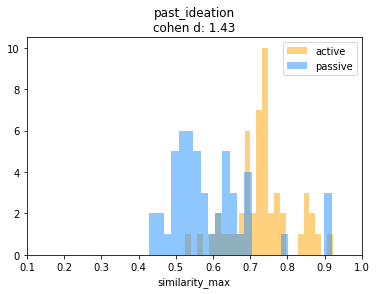

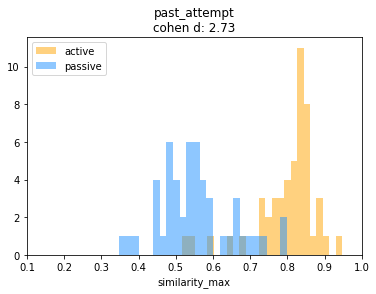

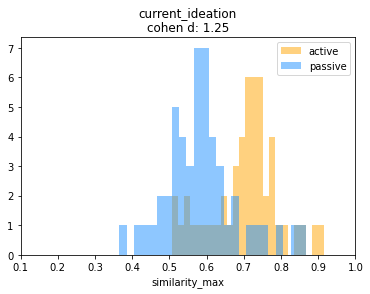

In [607]:
metric = 'similarity_max'
for post_types in ['past_ideation', 'past_attempt', 'current_ideation']:
    
    active = clean_features[clean_features[post_types]==1]['active_'+metric].values
    passive = clean_features[clean_features[post_types]==1]['passive_'+metric].values
    plt.hist(active, bins = 25, label='active', alpha=0.5, color='orange')
    plt.hist(passive, bins = 25, label='passive',alpha=0.5, color='dodgerblue')
    d = cohen_d(active,passive)
    plt.title(f'{post_types}\ncohen d: {np.round(d,2)}')
    plt.legend()
    plt.xlabel(metric)
    plt.xlim((0.1,1))
    
    plt.show()
    
    

similarity_sum======


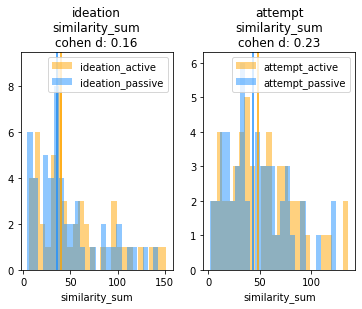

similarity_mean======


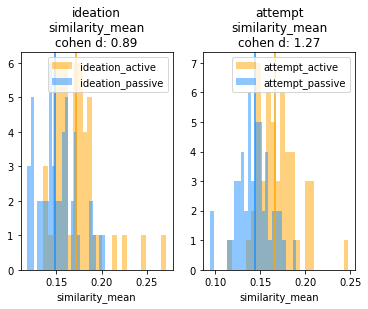

similarity_median======


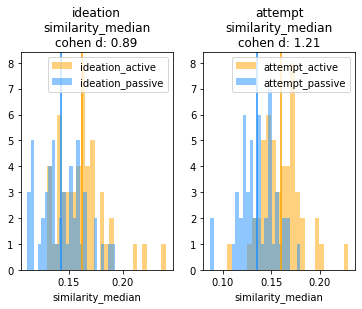

similarity_min======


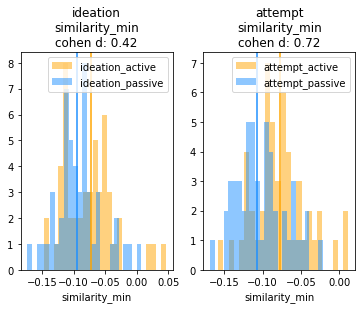

similarity_max======


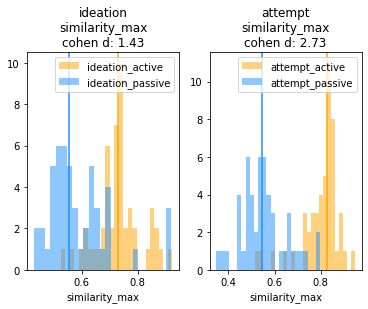

similarity_mean_above_median======


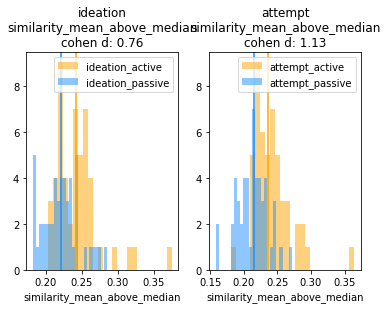

similarity_mean_above_75======


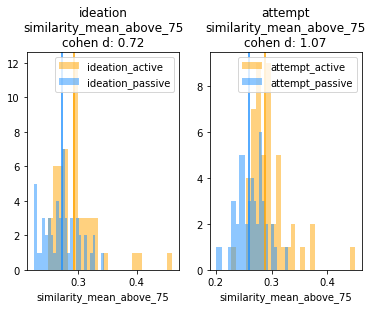

similarity_top_30======


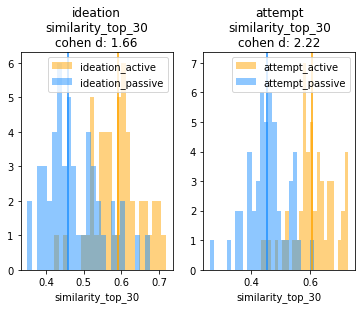

In [613]:
metrics = ['similarity_sum', 'similarity_mean','similarity_median','similarity_min', 'similarity_max','similarity_mean_above_median', 'similarity_mean_above_75','similarity_top_30']

metrics_df = []

for metric in metrics:    
    ideation_active = clean_features[clean_features['past_ideation']==1]['active_'+metric].values
    ideation_passive = clean_features[clean_features['past_ideation']==1]['passive_'+metric].values
    attempt_active = clean_features[clean_features['past_attempt']==1]['active_'+metric].values
    attempt_passive = clean_features[clean_features['past_attempt']==1]['passive_'+metric].values
    d_ideation = cohen_d(ideation_active, ideation_passive)
    d_attempt = cohen_d(attempt_active, attempt_passive)

    metrics_df.append([metric, d_ideation,d_attempt])
    
    print(metric+'======')
    # ideation   
    plt.subplot(1, 2, 1)
    bins = 25
    plt.hist(ideation_active, bins = bins, label='ideation_active', alpha=0.5, color='orange')
    plt.hist(ideation_passive, bins = bins, label='ideation_passive',alpha=0.5, color='dodgerblue')
    plt.axvline(x=np.median(ideation_active), color = 'orange')
    plt.axvline(x=np.median(ideation_passive), color = 'dodgerblue')
    plt.title(f'ideation\n{metric}\ncohen d: {np.round(d_ideation,2)}')
    plt.legend()
    plt.xlabel(metric)
    # plt.xlim((0,1))

    
    plt.subplot(1, 2, 2)
    # active     
    plt.hist(attempt_active, bins = bins, label='attempt_active', alpha=0.5, color='orange')
    plt.hist(attempt_passive, bins = bins, label='attempt_passive',alpha=0.5, color='dodgerblue')
    plt.axvline(x=np.median(attempt_active), color = 'orange')
    plt.axvline(x=np.median(attempt_passive), color = 'dodgerblue')
    plt.title(f'attempt\n{metric}\ncohen d: {np.round(d_attempt,2)}')
    plt.legend()
    plt.xlabel(metric)
    # plt.xlim((0,1))
    plt.show()
    

    

    
    
# plt.hist(active, bins = 25, label='active', alpha=0.5, color='orange')
# plt.hist(passive, bins = 25, label='passive',alpha=0.5, color='dodgerblue')
# d = cohen_d(active,passive)
# plt.title(f'{post_types}\ncohen d: {np.round(d,2)}')
# plt.legend()
# plt.xlabel(metric)
# plt.xlim((0.1,1))

# plt.show()


In [609]:
metrics_df= pd.DataFrame(metrics_df)

metrics_df.columns = ['metric', 'd_ideation', 'd_attempt']
metrics_df
# metrics_df['difference'] = metrics_df.d_passive - metrics_df.d_active  
# metrics_df.sort_values('d_active')

,metric,d_ideation,d_attempt
0,similarity_sum,0.160377,0.228678
1,similarity_mean,0.887845,1.273916
2,similarity_median,0.891762,1.209838
3,similarity_min,0.419947,0.722689
4,similarity_max,1.433282,2.734195
5,similarity_mean_above_median,0.763405,1.130326
6,similarity_mean_above_75,0.724010,1.070085
7,similarity_top_30,1.656640,2.222680


In [610]:
doc_id = 5442784
print(stats_df[stats_df['id']==doc_id].content.values[0])
pairwise_all.get('active | '+str(doc_id))

Great article. I’ve had the suicide attempt after going through lengthy divorce.!


,level_0,level_1,0
0,suicide attempt,the suicide attempt after,0.909900
1,suicide attempt,the suicide attempt after going,0.872564
2,suicide attempt,suicide attempt after going through,0.843127
3,suicide attempt,suicide attempt after going,0.837704
4,suicide attempt,had the suicide attempt,0.795542
5,suicide attempt,had the suicide attempt after,0.784748
6,suicide attempt,ve had the suicide attempt,0.757862
7,suicide attempt,article ve had the suicide,0.640075
11,suicide attempt,ve had the suicide,0.618292
26,suicide attempt,attempt after going through,0.431611


In [611]:
stats_df = pd.DataFrame(stats, columns=columns)
stats_df = stats_df[['active_similarity_mean_above_median', 'passive_similarity_mean_above_median']]
stats_df = pd.concat([clean_set, stats_mean_above_median], axis=1)
stats_df.sort_values('active_similarity_mean_above_median')[::-1]


,id,uniq_author_identifier,content,question_response_comments_id,created_at,current_ideation,past_attempt,past_ideation,original_agreement,original_agreement.1,active_similarity_mean_above_median,passive_similarity_mean_above_median
124,2413574,a86f1700f1d100327638043929abb6c1,I have come close to my candle burning out. I'...,2413574.0,2017-03-12 16:13:20,1,0.0,0.0,FULL AGREEMENT,Agreement,0.420865,0.328676
139,5441807,a59c2f5610d4c6fa235f94577b9a5170,I have helped one SGT going through a bad time...,5441807.0,2020-01-14 05:40:40,1,0.0,0.0,FULL AGREEMENT,Agreement,0.399934,0.363314
49,1813511,42638c4f157cebae566828757b57d18b,", Thank you for that incredible story. As you ...",1813511.0,2016-08-17 17:05:45,0,1.0,0.0,FULL AGREEMENT,Agreement,0.365232,0.265176
149,3245239,651d67f4436b819e4f370ef0291fd8bc,What should I do if I'm depressed and I want o...,3245239.0,2018-01-11 01:14:32,1,0.0,0.0,DISCREPANCY,Discrepancy,0.351667,0.332310
72,4632581,41b66df8769e0d3377ad74afc8c8aedf,Brother the only people who will ever understa...,4632581.0,2019-05-13 22:51:55,0,0.0,1.0,Agreement,Agreement,0.331576,0.290976
...,...,...,...,...,...,...,...,...,...,...,...,...
50,4443445,0625057bd5eb5d36131f6beb4102e884,"Thank you, my friend for sharing the music v...",4443445.0,2019-03-13 01:08:04,0,0.0,1.0,Agreement,Agreement,0.200647,0.191427
9,5442784,1fdbea08478fe6ae195d106770f2d260,Great article. I’ve had the suicide attempt af...,5442784.0,2020-01-14 15:14:45,0,1.0,0.0,FULL AGREEMENT,Agreement,0.199621,0.197266
58,4384124,56846f28e41c759f91696f568b08c3d0,I spent my twenty-seven years alone; working m...,4384124.0,2019-02-20 14:09:37,0,0.0,1.0,Agreement,Agreement,0.198502,0.193409
96,3134984,c3c6922c44e5330bfea673df679c45f7,"LtCol Brown, thank you for being so enthusiast...",3134984.0,2017-12-01 05:15:49,0,0.0,1.0,Agreement,Agreement,0.192331,0.211075


In [612]:
stats_df.

SyntaxError: invalid syntax (3797290479.py, line 1)

In [ ]:
suicidality_type = suicidality_passive
# st_model = symptom_tracker.KeyBERT(model=model)
distances,candidates, keywords,final_ngram_range = st_model.extract_keywords(doc, seed_keywords = suicidality_type, 
                                         # vectorizer = vectorizer,
                                         keyphrase_ngram_range=keyphrase_ngram_range, 
                                         stop_words=stop_words, top_n=30, highlight=False)

print(final_ngram_range)
pairwise = pd.DataFrame(distances, columns = candidates, index = suicidality_type)
print(pairwise.median().median())
print(pairwise.min().min())
print(pairwise.max().max())